In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
280,2021-10-14,2.654
281,2021-10-15,0.000
282,2021-10-16,0.000
283,2021-10-17,0.754


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-11-04    2.654
2021-11-05    0.000
2021-11-06    0.000
2021-11-07    0.754
2021-11-08    0.333
Name: Vacunas, Length: 285, dtype: float64

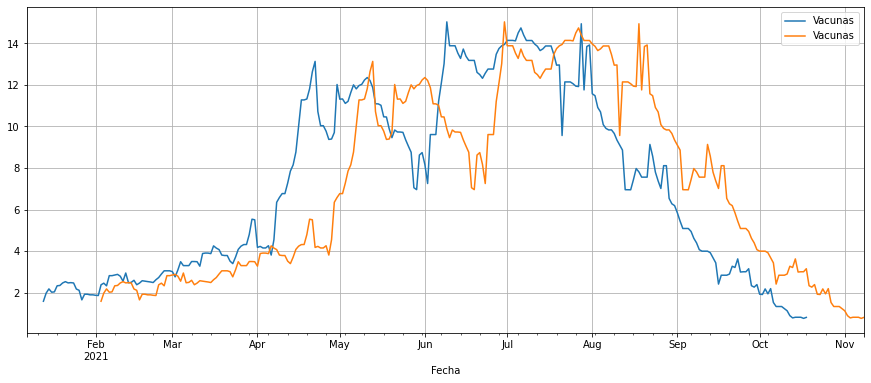

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

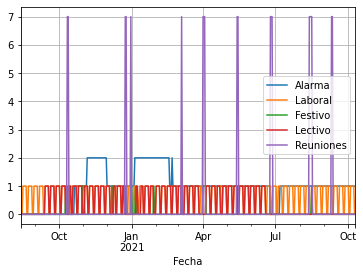

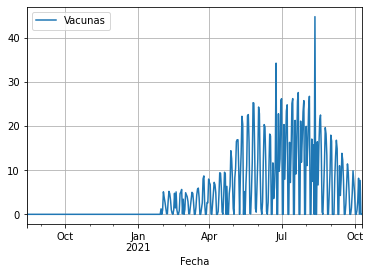

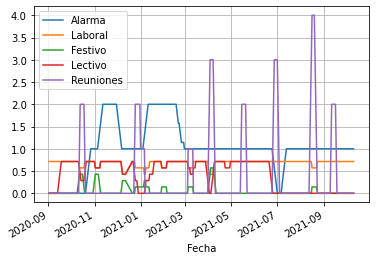

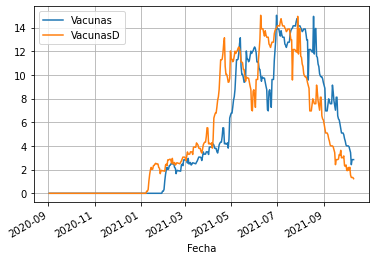

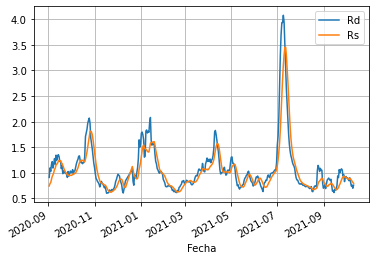

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
puntos.loc['2020/10/31':'2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']

puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1
#puntos.loc['2021-10-12','Festivo']=1

puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
#puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7
#puntos.loc['2021/10/9':'2021/10/13','Reuniones']=7
#puntos.loc['2021/10/15':'2021/10/16','Reuniones']=7


puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-06,3,62,2343,0.0,2.65,39.06,40,11,6,8,...,39.990790,87.718394,88.902681,81.219997,86.113931,89.024713,88.584716,89.185184,91.145835,88.908899
2021-10-07,4,63,2149,0.0,2.93,42.84,50,15,5,6,...,39.989645,87.713619,88.894553,81.215960,86.109697,89.022220,88.580836,89.180660,91.140657,88.902916
2021-10-08,5,50,989,0.0,5.06,4.00,44,8,3,5,...,39.752133,87.709829,88.890218,81.213538,86.106169,89.017234,88.577441,89.179529,91.135479,88.897597
2021-10-09,6,22,443,0.0,4.97,20.02,17,2,0,4,...,39.752133,87.708161,88.889134,81.213538,86.103346,89.015240,88.576471,89.177266,91.133999,88.894938
2021-10-10,7,21,767,0.0,2.74,14.91,18,1,1,2,...,39.752102,87.706569,88.888592,81.212731,86.101935,89.013744,88.574531,89.174439,91.132520,88.892944


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-10-12,2021-10-13,2021-10-14,2021-10-15,2021-10-16,2021-10-17,2021-10-18,2021-10-19,2021-10-20,2021-10-21
Día de la semana,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00
Casos,26.000000,57.000000,5.400000e+01,74.000000,34.000000,30.000000,87.000000,93.000000,NaN,NaN
test coresp,921.000000,1950.000000,1.907000e+03,1215.000000,584.000000,984.000000,2256.000000,2649.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,0.000000,0.000000,0.000000e+00,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN
Tasa de positividad (%),2.820000,2.920000,2.830000e+00,6.090000,5.820000,3.050000,3.860000,3.510000,NaN,NaN
Asintomáticos,22.100000,35.910000,3.294000e+01,40.700000,28.900000,24.000000,65.250000,58.590000,NaN,NaN
Zaragoza,21.000000,41.000000,4.200000e+01,60.000000,28.000000,25.000000,70.000000,63.000000,NaN,NaN
1 a 14 años,4.000000,13.000000,1.100000e+01,17.000000,7.000000,5.000000,15.000000,10.000000,NaN,NaN
15 a 24 años,0.000000,3.000000,2.000000e+00,4.000000,1.000000,1.000000,2.000000,5.000000,NaN,NaN
25 a 34 años,1.000000,7.000000,5.000000e+00,9.000000,4.000000,2.000000,10.000000,9.000000,NaN,NaN


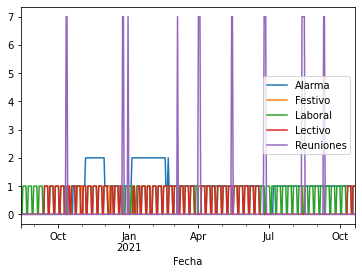

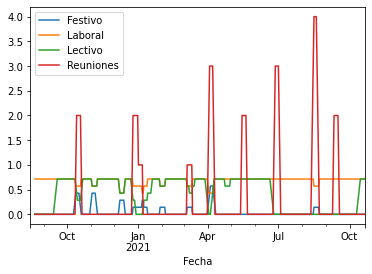

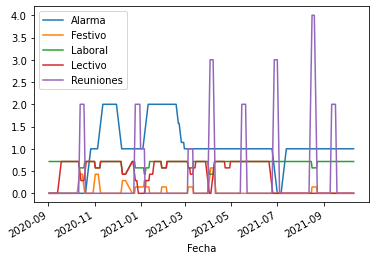

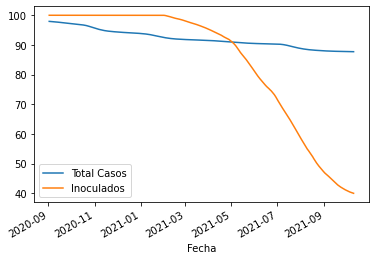

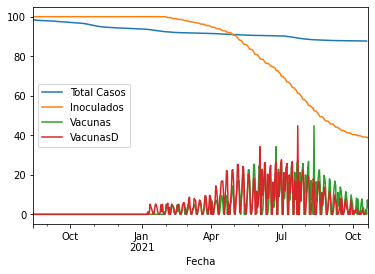

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

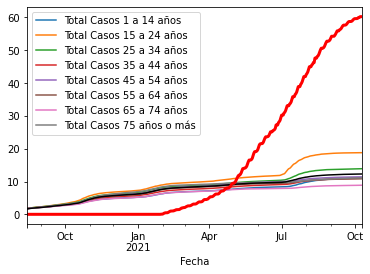

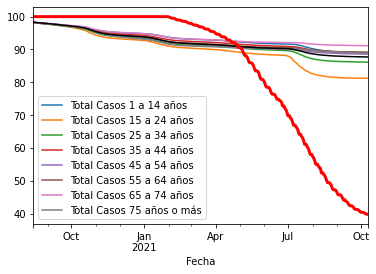

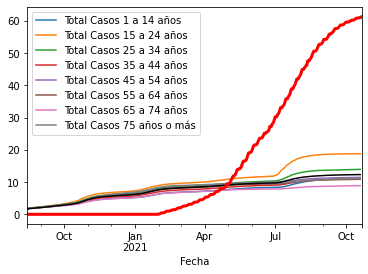

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-10-17,87.681783,39.100175
2021-10-18,87.675189,39.027563
2021-10-19,87.668140,39.027563


,Total Casos,Inoculados
Fecha,,
2021-10-11,87.702628,39.711109
2021-10-12,87.700657,39.534360
2021-10-13,87.696337,39.294095
2021-10-14,87.692244,39.203601
2021-10-15,87.686634,39.102990
2021-10-16,87.684057,39.100175
2021-10-17,87.681783,39.100175
2021-10-18,87.675189,39.027563
2021-10-19,87.668140,39.027563


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-11,1,52.0,1104.0,0.0,4.71,39.00,38.0,7.0,6.0,9.0,...,39.711109,87.702628,88.884799,81.207887,86.095584,89.009756,88.571621,89.172177,91.130300,88.886960
2021-10-12,2,26.0,921.0,0.0,2.82,22.10,21.0,4.0,0.0,1.0,...,39.534360,87.700657,88.882632,81.207887,86.094878,89.005767,88.570650,89.170480,91.128821,88.882972
2021-10-13,3,57.0,1950.0,0.0,2.92,35.91,41.0,13.0,3.0,7.0,...,39.294095,87.696337,88.875587,81.205465,86.089939,89.000283,88.568710,89.168783,91.125122,88.875659
2021-10-14,4,54.0,1907.0,0.0,2.83,32.94,42.0,11.0,2.0,5.0,...,39.203601,87.692244,88.869626,81.203851,86.086410,88.994799,88.564830,89.163693,91.122903,88.872335
2021-10-15,5,74.0,1215.0,0.0,6.09,40.70,60.0,17.0,4.0,9.0,...,39.102990,87.686634,88.860414,81.200622,86.080059,88.987819,88.558039,89.159169,91.122163,88.869011
2021-10-16,6,34.0,584.0,0.0,5.82,28.90,28.0,7.0,1.0,4.0,...,39.100175,87.684057,88.856621,81.199814,86.077237,88.982833,88.556099,89.156907,91.120684,88.867681
2021-10-17,7,30.0,984.0,NaN,3.05,24.00,25.0,5.0,1.0,2.0,...,39.100175,87.681783,88.853912,81.199007,86.075825,88.979842,88.554159,89.155210,91.119204,88.863692
2021-10-18,1,87.0,2256.0,NaN,3.86,65.25,70.0,15.0,2.0,10.0,...,39.027563,87.675189,88.845784,81.197392,86.068769,88.971366,88.545914,89.147858,91.114765,88.859703
2021-10-19,2,93.0,2649.0,NaN,3.51,58.59,63.0,10.0,5.0,9.0,...,39.027563,87.668140,88.840365,81.193356,86.062418,88.963389,88.535243,89.142203,91.105149,88.854385


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-17,7,30.0,984.0,NaN,3.05,24.00,25.0,5.0,1.0,2.0,...,91.119204,88.863692,17432.0,21183.0,17323.0,18694.0,20093.0,16170.0,9707.0,14194.0
2021-10-18,1,87.0,2256.0,NaN,3.86,65.25,70.0,15.0,2.0,10.0,...,91.114765,88.859703,17447.0,21185.0,17333.0,18711.0,20110.0,16183.0,9713.0,14200.0
2021-10-19,2,93.0,2649.0,NaN,3.51,58.59,63.0,10.0,5.0,9.0,...,91.105149,88.854385,17457.0,21190.0,17342.0,18727.0,20132.0,16193.0,9726.0,14208.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    #'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.854198,0.940491,0.914976,0.836996,0.968821,0.778474,0.915550,0.728087,0.801067,0.837508,...,1,1,1.000106,1.000191,1.000115,1.000090,1.000086,1.000081,1.000049,1.000058
2,1.204707,1.216948,0.984510,1.174779,0.973318,1.209683,1.000626,1.266369,1.177782,1.199793,...,1,1,1.000057,1.000120,1.000058,1.000038,1.000042,1.000032,1.000032,1.000038
3,1.188256,1.220321,0.975003,1.181930,0.993848,1.207659,1.017357,1.208284,1.246982,1.188565,...,1,1,1.000007,1.000012,1.000003,0.999990,0.999994,0.999988,1.000007,1.000019
4,1.208414,1.133603,1.068347,1.232526,1.021272,1.220190,1.014792,1.228096,1.257749,1.215330,...,1,1,0.999955,0.999900,0.999940,0.999958,0.999953,0.999958,0.999973,0.999966
5,1.128743,1.112224,1.023340,1.074322,0.950513,1.134371,1.013316,1.163103,1.164318,1.169791,...,1,1,0.999904,0.999802,0.999885,0.999916,0.999915,0.999926,0.999944,0.999938
6,0.844910,0.810585,1.059025,0.924913,1.086966,0.888392,1.051202,0.925933,0.826531,0.830388,...,1,1,0.999923,0.999873,0.999928,0.999953,0.999949,0.999958,0.999961,0.999953
7,0.547756,0.564143,0.957320,0.555186,1.006633,0.539249,0.986480,0.468053,0.502293,0.531174,...,1,1,1.000040,1.000084,1.000059,1.000048,1.000052,1.000047,1.000027,1.000020


Casos                        0.996712
test coresp                  0.999759
Tasa de positividad (%)      0.997503
Asintomáticos                0.997236
Asintomáticos (%)            1.000196
Zaragoza                     0.996860
Zaragoza (%)                 0.999903
1 a 14 años                  0.998275
15 a 24 años                 0.996674
25 a 34 años                 0.996079
35 a 44 años                 0.994934
45 a 54 años                 0.997403
55 a 64 años                 0.995036
65 a 74 años                 0.997396
75 años o más                0.991261
Camas Ocup                   0.998140
Camas libres                 0.999922
Camas (%)                    0.997272
UCI ocupadas                 0.998784
UCI libres con resp          0.999535
UCI (%)                      0.997939
Rs                           1.000000
Rd                           1.000000
Inoculados                   1.000000
Total Casos                  1.000000
Total Casos 1 a 14 años      0.999999
Total Casos 

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-10-06    0.831758
2021-10-07    0.740331
2021-10-08    0.756757
2021-10-09    0.715400
2021-10-10    0.740891
Name: Casos, Length: 423, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-10-11         NaN
2021-10-12    0.500000
2021-10-13    2.192308
2021-10-14    0.947368
2021-10-15    1.370370
2021-10-16    0.459459
2021-10-17    0.882353
2021-10-18    2.900000
2021-10-19    1.068966
2021-10-20         NaN
2021-10-21         NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,0.978313,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,0.823529,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,0.921569,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,33.428571,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,31.714286,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,34.000000,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,33.857143,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,32.000000,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-06,62.857143,1766.714286,3.941429,36.302857,60.285714,47.571429,74.673152,11.428571,4.285714,6.428571,...,40.313085,87.732092,88.919557,81.230838,86.125423,89.040667,88.594348,89.197464,91.161581,88.923810
2021-10-07,57.428571,1750.428571,3.722857,34.342857,62.000000,42.285714,73.705504,10.571429,4.285714,5.714286,...,40.238281,87.727739,88.913829,81.227378,86.121391,89.035966,88.591299,89.193748,91.156720,88.918776
2021-10-08,56.000000,1706.571429,3.784286,31.314286,57.142857,41.714286,74.848361,10.428571,4.142857,5.000000,...,40.150284,87.723494,88.908177,81.224033,86.117863,89.031479,88.588042,89.190355,91.151753,88.913743


<AxesSubplot:xlabel='Fecha'>

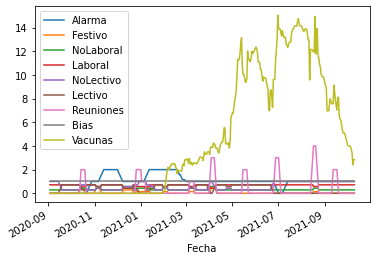

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 13.5 ms, sys: 11.3 ms, total: 24.8 ms
Wall time: 5.34 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000026,-0.000007,-0.006970,-0.000309,0.002306,-0.000383,-0.001385,-0.001098,0.000979,0.001308,...,1.055281,0.008585,0.049366,-3.636339,-3.443317,-3.523058,-3.556598,0.001613,-7.079656,0.001806
2020-09-04,0.000254,0.000032,-0.002576,-0.000387,0.001569,-0.000191,-0.000787,-0.001865,0.000110,0.000837,...,0.890326,0.008080,0.010248,-4.535170,-4.468380,-4.484755,-4.518795,0.003281,-9.003550,0.000022
2020-09-05,0.000874,-0.000004,-0.005839,-0.000529,0.003090,-0.000582,-0.000285,-0.000916,0.000367,0.000038,...,0.657207,0.016816,0.039550,-2.027251,-1.896270,-1.944180,-1.979341,0.000086,-3.923521,0.001661
2020-09-06,-0.000131,-0.000025,-0.007629,-0.000229,0.002166,0.000374,-0.000327,-0.000491,0.000658,0.001196,...,0.570451,0.005759,0.054968,-1.885011,-1.776872,-1.816560,-1.845322,-0.001189,-3.661883,0.000126
2020-09-07,0.000219,-0.000007,-0.001574,-0.000035,0.000102,0.000418,0.001378,-0.000938,-0.000294,0.000111,...,0.262802,0.005957,0.040765,-1.540730,-1.470846,-1.489762,-1.521814,-0.001070,-3.011576,-0.002600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-06,0.001014,-0.000039,-0.004800,-0.000545,0.003820,0.000170,0.001409,-0.000923,-0.000900,-0.000989,...,-0.304941,0.035544,0.018424,3.102188,3.110835,3.118223,3.094800,-0.004669,6.213023,0.002784
2021-10-07,0.000822,-0.000053,-0.006155,-0.000318,0.002623,0.000510,-0.000442,-0.000729,-0.000831,-0.001097,...,-0.267747,0.036764,0.015167,4.087583,4.119663,4.114905,4.092340,-0.004183,8.207245,0.003246
2021-10-08,0.000791,-0.000043,-0.002983,-0.000235,0.002820,0.000199,-0.000657,0.000061,-0.000271,-0.001086,...,-0.193889,0.031438,-0.004268,4.497829,4.538355,4.532606,4.503578,-0.001927,9.036184,0.000271



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


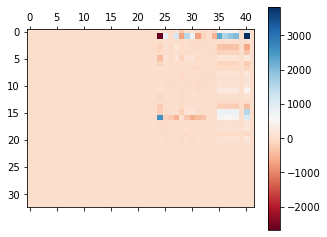

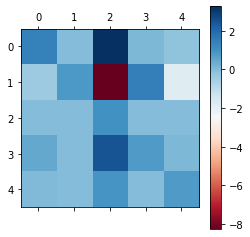

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(42, 395) = (42, 42)·(42, 42)·(42, 395)
CPU times: user 87.4 ms, sys: 12.3 ms, total: 99.7 ms
Wall time: 17.6 ms


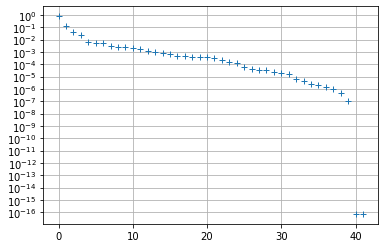

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{32}$,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$
Casos,-0.118044,0.246623,-0.173154,-0.671736,0.073903,0.036423,0.045772,0.412419,0.003223,-0.111062,...,0.000927,0.001646,0.001773,1.118643e-04,0.000174,0.000069,0.000086,0.000012,1.790477e-17,4.763444e-18
test coresp,-0.888373,0.332287,-0.079505,0.303679,0.008008,-0.018549,0.000182,0.008723,0.002140,0.030081,...,-0.000024,-0.000095,0.000002,5.493512e-07,-0.000003,-0.000027,0.000008,-0.000004,-1.745754e-19,3.348694e-19
Tasa de positividad (%),-0.003483,0.000550,-0.001915,-0.023984,-0.011743,0.003803,-0.015138,0.021698,-0.033681,-0.001902,...,-0.006019,-0.003257,0.001423,-6.236059e-03,-0.002288,-0.007865,0.000597,-0.000522,9.077943e-17,6.492543e-17
Asintomáticos,-0.059635,0.133173,-0.108006,-0.337960,0.058811,-0.192923,0.364488,-0.713092,0.280972,-0.126727,...,-0.000681,0.000050,-0.000698,-1.779666e-04,-0.000295,-0.000089,-0.000063,-0.000001,-4.950418e-18,2.813623e-19
Asintomáticos (%),-0.014430,-0.023617,0.001223,0.006629,0.034645,-0.047301,0.073468,-0.097528,0.208787,-0.095849,...,-0.001565,0.000259,0.001070,9.378735e-05,0.001341,-0.000326,0.000140,0.000043,1.206837e-17,5.011500e-18
Zaragoza,-0.082651,0.156571,-0.118135,-0.411634,0.006406,0.202137,-0.304310,-0.169450,-0.295014,0.156680,...,0.000611,0.000290,-0.000647,8.762541e-05,0.000344,0.000001,0.000062,0.000015,-3.616789e-18,-2.261484e-18
Zaragoza (%),-0.020891,-0.041762,0.005026,0.033372,0.040973,0.179302,-0.154989,-0.134475,0.004473,-0.243410,...,0.001317,0.001660,-0.000312,-9.472776e-04,0.000076,0.000199,0.000412,-0.000050,2.035563e-17,-2.313902e-18
1 a 14 años,-0.014278,0.023099,-0.028803,-0.038480,0.075848,-0.321015,0.072869,-0.004365,-0.494169,-0.377265,...,-0.001034,0.002331,-0.000731,-7.670634e-04,-0.000728,0.000295,-0.000453,0.000040,2.872911e-18,-1.541129e-17
15 a 24 años,-0.018119,0.036169,-0.192863,-0.123009,-0.827114,0.047997,-0.107328,0.104340,0.217566,0.024285,...,-0.001172,-0.001422,-0.001583,-2.638668e-04,-0.000029,0.000048,-0.000334,0.000005,-1.497369e-17,-3.961932e-18
25 a 34 años,-0.014573,0.031461,-0.067319,-0.086432,-0.133671,-0.040774,0.016641,-0.105499,-0.090207,-0.085986,...,0.001928,-0.000169,-0.001709,-1.141866e-03,0.000116,0.000429,-0.000183,-0.000042,-2.855029e-17,-5.522564e-18


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 2.08 ms, sys: 231 µs, total: 2.31 ms
Wall time: 2.16 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 104 ms, sys: 3.07 ms, total: 107 ms
Wall time: 16.1 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.186371,0.002806,2.459412,0.133609,-0.289941,-0.382425,0.331937,-1.125095,0.329541,-0.055213,...,-2.259761,-4.796147,-61.215513,22.996023,-23.491071,0.157242,-0.652289,1.106759,-0.495048,0.158290
test coresp,-3.246534,0.850937,-4.064102,2.588947,-4.117619,0.602544,-1.997122,0.023498,3.427770,2.627058,...,-46.151965,-19.757850,-393.730328,252.014043,-254.263643,-52.779994,50.530393,2.460869,-2.249601,-1.371964
Tasa de positividad (%),0.011610,0.000619,1.026352,-0.006727,-0.007627,-0.010838,0.008363,-0.025193,-0.001131,0.003438,...,0.012711,-0.322073,0.282875,-0.705516,0.712563,0.266182,-0.259135,0.023764,0.007046,0.010284
Asintomáticos,0.096805,-0.002744,1.771472,0.917542,-0.093750,-0.144887,0.426779,-0.381787,0.376292,-0.130066,...,-3.126131,-2.949213,-28.480336,7.912679,-8.035648,-0.681786,0.558817,-0.256467,-0.122969,-0.620552
Asintomáticos (%),0.005333,0.001751,0.538336,0.012768,0.787409,0.003850,0.116005,-0.022800,0.008076,-0.067680,...,-1.170565,0.144459,-0.982009,1.115836,-1.080851,0.353903,-0.318917,-0.084129,0.034985,-0.261819
Zaragoza,0.278505,0.002962,1.183413,0.090320,0.083151,0.523358,0.373368,-0.718943,0.227655,-0.106699,...,2.777934,-3.623292,-28.975208,2.965178,-3.327285,2.349884,-2.711991,0.498815,-0.362107,-0.043427
Zaragoza (%),0.000332,-0.000156,-0.231318,-0.001491,0.051832,-0.001830,0.900360,0.009547,-0.003835,0.014140,...,0.614247,-0.180285,3.916066,-3.621308,3.651671,0.678222,-0.647859,-0.150843,0.030363,-0.111898
1 a 14 años,-0.017129,0.000295,0.449921,0.057718,-0.068714,-0.050369,0.073412,0.804201,0.066647,0.064229,...,0.222048,-0.246891,-5.021684,0.005735,-0.047820,0.024256,-0.066341,0.102437,-0.042085,-0.002148
15 a 24 años,0.085291,0.004998,1.055698,0.039578,-0.329347,-0.079489,0.044302,-0.325750,0.882886,0.007016,...,-8.262908,-7.130492,-16.640458,10.118186,-9.884963,-1.537893,1.771116,0.827894,0.233223,-0.069774
25 a 34 años,0.012462,0.000472,0.450882,0.012438,0.006415,-0.035037,0.050440,-0.128582,0.089325,0.866701,...,-0.223658,-0.408260,-6.336813,4.014732,-4.081328,-0.553578,0.486982,-0.035882,-0.066596,0.035710


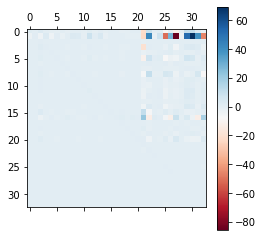

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.186371,0.002806,2.459412,0.133609,-0.289941,-0.382425,0.331937,-1.125095,0.329541,-0.055213,...,0.840066,1.528556,-10.395013,-0.757821,-11.720000,-0.577527,10.420150,10.891670,2.534991,-2.259761
test coresp,-3.246534,0.850937,-4.064102,2.588947,-4.117619,0.602544,-1.997122,0.023498,3.427770,2.627058,...,-1.393961,8.013766,-51.169080,27.806864,-85.545864,-3.650894,51.327784,69.473643,38.947064,-46.151965
Tasa de positividad (%),0.011610,0.000619,1.026352,-0.006727,-0.007627,-0.010838,0.008363,-0.025193,-0.001131,0.003438,...,0.011389,-0.027238,0.185603,-0.080386,0.112535,0.042764,-0.102302,-0.141260,-0.036680,0.012711
Asintomáticos,0.096805,-0.002744,1.771472,0.917542,-0.093750,-0.144887,0.426779,-0.381787,0.376292,-0.130066,...,-0.041327,0.315507,-1.833569,1.516162,-5.017552,0.122373,2.647819,3.381420,1.843885,-3.126131
Asintomáticos (%),0.005333,0.001751,0.538336,0.012768,0.787409,0.003850,0.116005,-0.022800,0.008076,-0.067680,...,-0.261499,-0.115463,0.956632,1.159704,-0.186803,0.101150,-0.683018,-0.334858,0.522246,-1.170565
Zaragoza,0.278505,0.002962,1.183413,0.090320,0.083151,0.523358,0.373368,-0.718943,0.227655,-0.106699,...,1.021077,1.076039,-7.754196,-3.723781,-4.684470,-0.537427,7.120827,5.848615,-1.168744,2.777934
Zaragoza (%),0.000332,-0.000156,-0.231318,-0.001491,0.051832,-0.001830,0.900360,0.009547,-0.003835,0.014140,...,0.087218,-0.088482,0.672376,-0.870249,0.912191,0.164193,-0.430931,-0.711179,-0.298337,0.614247
1 a 14 años,-0.017129,0.000295,0.449921,0.057718,-0.068714,-0.050369,0.073412,0.804201,0.066647,0.064229,...,0.091323,0.145370,-0.757550,-0.550161,-0.711333,0.052886,0.854366,0.750198,-0.011840,0.222048
15 a 24 años,0.085291,0.004998,1.055698,0.039578,-0.329347,-0.079489,0.044302,-0.325750,0.882886,0.007016,...,-0.778893,-0.763163,5.359183,4.614461,-3.644670,1.032348,-2.563750,-0.272900,5.381690,-8.262908
25 a 34 años,0.012462,0.000472,0.450882,0.012438,0.006415,-0.035037,0.050440,-0.128582,0.089325,0.866701,...,0.070787,0.200719,-1.504928,0.233606,-1.385593,-0.209563,1.221876,1.353460,0.203500,-0.223658


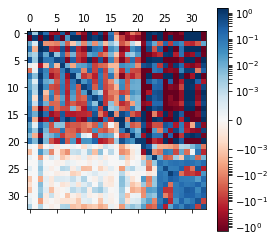

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(33, 395) = (33, 33)·(33, 33)·(33, 395)
CPU times: user 51.9 ms, sys: 29.6 ms, total: 81.4 ms
Wall time: 12.7 ms


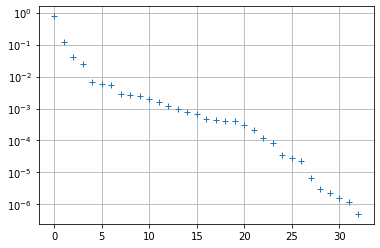

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.118025,0.246778,-0.173130,-0.671665,0.073996,-0.037007,0.047514,-0.405670,0.016840,-0.145314,...,0.045911,0.001063,0.006796,0.009851,0.004444,0.002685,0.001595,0.000179,0.000364,0.000007
test coresp,-0.888389,0.332048,-0.079853,0.303829,0.007822,0.018740,-0.000190,-0.010254,0.001938,0.029322,...,0.004490,-0.000533,-0.000813,0.000049,0.000052,-0.000067,0.000024,0.000006,-0.000014,-0.000030
Tasa de positividad (%),-0.003482,0.000568,-0.001887,-0.024021,-0.011995,-0.003946,-0.014964,-0.019493,0.034593,-0.008194,...,0.944907,-0.077813,-0.197891,-0.010958,0.031880,0.009258,0.005717,-0.007281,-0.004515,-0.006645
Asintomáticos,-0.059612,0.133275,-0.108453,-0.337538,0.064378,0.196747,0.360031,0.697925,-0.339009,-0.056886,...,0.026695,-0.003146,-0.007332,-0.001679,0.001040,0.000190,-0.000449,-0.000264,-0.000382,0.000031
Asintomáticos (%),-0.014434,-0.023687,0.001012,0.007006,0.037478,0.048403,0.072494,0.082371,-0.228617,-0.072731,...,-0.042903,0.015256,0.017281,0.021462,-0.006691,-0.002680,0.000793,0.000400,0.001306,-0.000697
Zaragoza,-0.082631,0.156740,-0.118117,-0.411782,0.003146,-0.205575,-0.303483,0.182202,0.289892,0.160793,...,-0.057972,-0.023897,-0.000360,-0.015380,0.000068,0.000394,-0.000979,-0.000030,0.000095,-0.000210
Zaragoza (%),-0.020898,-0.041810,0.005050,0.033433,0.039941,-0.181692,-0.153650,0.144355,-0.041889,-0.229472,...,0.141362,0.052055,-0.006237,0.029234,-0.004799,0.004217,0.000050,-0.000750,0.000508,0.000271
1 a 14 años,-0.014279,0.023109,-0.028707,-0.038635,0.076996,0.319871,0.069063,0.056330,0.455382,-0.448268,...,-0.096504,0.031540,0.009854,0.006671,-0.002100,0.003419,-0.000277,-0.001103,-0.000620,0.000653
15 a 24 años,-0.018122,0.036168,-0.192910,-0.123348,-0.827832,-0.043093,-0.100049,-0.121946,-0.209324,0.032864,...,-0.063201,0.024610,-0.012677,0.007143,-0.013983,-0.002358,-0.001261,-0.000189,-0.000020,0.000127
25 a 34 años,-0.014568,0.031488,-0.067406,-0.086468,-0.133138,0.041815,0.016549,0.113612,0.074287,-0.100567,...,-0.049000,0.022480,0.030119,-0.012190,-0.000085,-0.002353,-0.002108,-0.000825,0.000644,0.000452


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

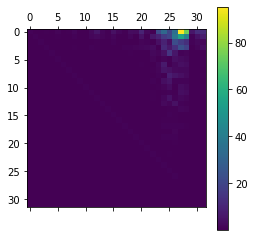

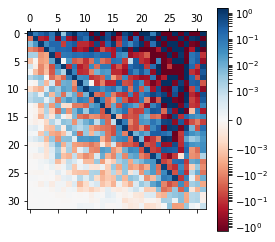

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

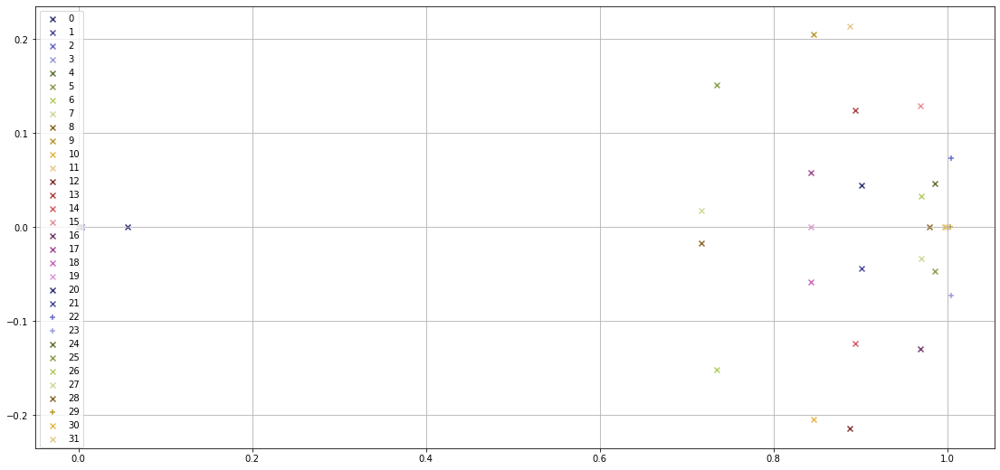

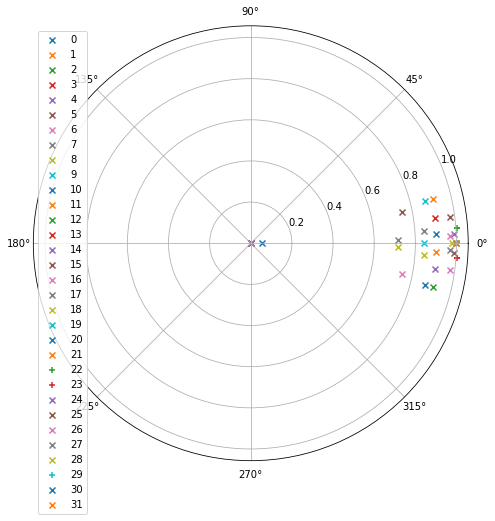

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-06,4.0,57.428571,1750.428571,479.285714,3.722857,34.342857,42.285714,10.571429,4.285714,5.714286,...,40.238281,87.727739,88.913829,81.227378,86.121391,89.035966,88.591299,89.193748,91.156720,88.918776
2021-10-07,4.0,56.000000,1706.571429,228.285714,3.784286,31.314286,41.714286,10.428571,4.142857,5.000000,...,40.150284,87.723494,88.908177,81.224033,86.117863,89.031479,88.588042,89.190355,91.151753,88.913743
2021-10-08,4.0,52.428571,1680.428571,97.000000,3.421429,31.287143,38.428571,8.857143,3.428571,5.000000,...,40.062288,87.719520,88.903378,81.221265,86.114334,89.027206,88.584994,89.186881,91.147103,88.908804
2021-10-09,4.0,52.285714,1650.714286,0.000000,3.490000,30.557143,38.857143,8.571429,3.571429,4.714286,...,39.974286,87.715557,88.898733,81.218382,86.111008,89.023075,88.581876,89.183164,91.142348,88.903961
2021-10-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-06,83.311216,2027.794509,3.521798,51.073305,62.405638,57.184929,75.641540,13.517969,16.493260,10.505457,...,40.497811,87.722793,88.863890,81.225452,86.112411,89.024809,88.608179,89.205853,91.141081,88.914880
2021-10-07,82.603085,1985.764306,3.544545,49.745682,61.977604,56.071838,74.855597,13.526022,16.438900,9.655395,...,40.387817,87.717804,88.856565,81.222715,86.105189,89.016160,88.603165,89.200839,91.137109,88.911681
2021-10-08,77.373634,1955.621793,3.393363,45.549397,60.958101,50.479364,73.249177,12.089301,16.384920,9.247249,...,40.283247,87.714555,88.850034,81.219227,86.098246,89.010545,88.598166,89.196047,91.133859,88.907242
2021-10-09,72.060442,1936.519930,3.176306,44.151023,62.463175,45.522367,72.302434,11.313717,15.506987,8.456401,...,40.210414,87.711583,88.846692,81.216334,86.089859,89.004868,88.593168,89.191526,91.127932,88.904432
2021-10-10,74.085293,1917.345276,3.287956,43.410723,58.783263,46.118311,73.123628,11.646711,17.361452,7.968157,...,40.119691,87.706843,88.843788,81.212513,86.086386,89.000058,88.594117,89.182649,91.123968,88.904944


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,...,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,7.651989,6.142803,-0.852246,11.327275,3.162695,4.098964,-1.235714,2.202529,51.746172,9.973968,...,0.164516,-0.008818,-0.066683,0.001231,-0.018778,-0.020156,0.036447,0.017157,-0.026176,-0.029452
std,7.096059,3.898003,4.397796,10.905453,4.006763,5.706314,1.867301,6.657910,58.878353,10.818822,...,0.207745,0.008769,0.026912,0.018959,0.018354,0.015140,0.041941,0.029907,0.013852,0.056254
min,-6.063655,-3.985639,-21.864962,-11.633872,-8.151152,-11.659703,-8.613684,-18.642812,-7.585992,-4.560418,...,-0.057419,-0.029771,-0.130368,-0.038661,-0.062193,-0.052331,-0.041801,-0.042336,-0.061046,-0.146051
25%,2.716481,3.663162,-3.100459,3.688611,0.367139,0.347319,-2.222201,-1.617319,16.766225,2.707601,...,0.001861,-0.013475,-0.086251,-0.012465,-0.026961,-0.030079,0.004563,-0.006650,-0.034388,-0.085042
50%,6.204466,5.391644,-0.598032,9.353719,2.618020,3.560384,-1.101734,1.510367,37.465377,7.260862,...,0.064502,-0.007894,-0.066821,0.005581,-0.017003,-0.023677,0.025895,0.021335,-0.026495,-0.020443
75%,10.959629,8.543627,2.196208,16.557744,5.875529,7.268360,-0.236185,5.476307,64.694532,13.836355,...,0.324471,-0.004616,-0.045488,0.013755,-0.007681,-0.009072,0.079975,0.043172,-0.016382,0.012629
max,41.307098,22.353646,12.430878,50.509358,20.115784,23.166233,8.834709,31.495127,406.375682,69.128017,...,0.744569,0.112709,0.027727,0.111739,0.125335,0.082844,0.159467,0.112046,0.062080,0.192531


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                          75.571429
test coresp                  2169.714286
Tasa de positividad (%)         3.532857
Asintomáticos                  44.864286
Asintomáticos (%)              58.142857
Zaragoza                       54.714286
Zaragoza (%)                   73.001595
1 a 14 años                    15.000000
15 a 24 años                    5.000000
25 a 34 años                    8.571429
35 a 44 años                   10.142857
45 a 54 años                   10.142857
55 a 64 años                    6.285714
65 a 74 años                    6.571429
75 años o más                  12.571429
Camas Ocup                     94.857143
Camas libres                 1472.142857
Camas (%)                       6.482666
UCI ocupadas                   24.142857
UCI libres con resp            93.428571
UCI (%)                        25.884811
Rs                              0.920540
Rd                              0.907992
Inoculados                     41.152286
Total Casos     

Casos                          77.571429
test coresp                  2167.428571
Tasa de positividad (%)         3.624286
Asintomáticos                  45.238571
Asintomáticos (%)              57.285714
Zaragoza                       58.428571
Zaragoza (%)                   75.290690
1 a 14 años                    15.285714
15 a 24 años                    4.571429
25 a 34 años                    9.285714
35 a 44 años                   12.571429
45 a 54 años                   11.714286
55 a 64 años                    5.714286
65 a 74 años                    6.000000
75 años o más                  11.428571
Camas Ocup                     93.000000
Camas libres                 1461.857143
Camas (%)                       6.401278
UCI ocupadas                   23.142857
UCI libres con resp            90.714286
UCI (%)                        25.475955
Rs                              0.915809
Rd                              0.929320
Inoculados                     41.026284
Total Casos     

Casos                          85.679507
test coresp                  2313.001700
Tasa de positividad (%)         3.237833
Asintomáticos                  51.598491
Asintomáticos (%)              59.532978
Zaragoza                       56.107985
Zaragoza (%)                   71.875895
1 a 14 años                    14.594526
15 a 24 años                   17.523469
25 a 34 años                   10.753870
35 a 44 años                    9.781694
45 a 54 años                    8.111054
55 a 64 años                    5.113121
65 a 74 años                    5.552427
75 años o más                   8.605206
Camas Ocup                     94.304219
Camas libres                 1438.966471
Camas (%)                       7.516472
UCI ocupadas                   22.565130
UCI libres con resp            95.366470
UCI (%)                        21.265531
Rs                              0.942360
Rd                              1.024940
Inoculados                     41.104847
Total Casos     

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-10-03,1.0,0.0,0.0,1.870,0.000,22.0,0.0
2021-10-04,1.0,0.0,0.0,0.692,0.926,67.0,0.0
2021-10-05,1.0,0.0,0.0,1.758,3.094,81.0,0.0
2021-10-06,1.0,0.0,0.0,2.614,8.176,62.0,0.0
2021-10-07,1.0,0.0,0.0,2.437,0.037,63.0,0.0
2021-10-08,1.0,0.0,0.0,0.000,7.677,50.0,0.0
2021-10-09,1.0,0.0,0.0,0.000,0.000,22.0,0.0
2021-10-10,1.0,0.0,0.0,1.132,0.001,21.0,0.0
2021-10-11,0.0,0.0,0.0,0.000,1.325,52.0,1.0
2021-10-12,0.0,0.0,0.0,0.110,5.713,26.0,1.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-10-09,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,1.0,1.0,2.844286
2021-10-10,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,2.844429
2021-10-11,0.857143,0.000000,0.285714,0.714286,1.000000,0.000000,3.0,1.0,2.901429
2021-10-12,0.714286,0.142857,0.285714,0.714286,1.000000,0.000000,4.0,1.0,3.275571
2021-10-13,0.571429,0.142857,0.285714,0.714286,1.000000,0.000000,5.0,1.0,3.217000
2021-10-14,0.428571,0.142857,0.285714,0.714286,0.857143,0.142857,5.0,1.0,3.629571
2021-10-15,0.285714,0.142857,0.285714,0.714286,0.714286,0.285714,6.0,1.0,2.997429
2021-10-16,0.142857,0.142857,0.285714,0.714286,0.714286,0.285714,6.0,1.0,3.010429
2021-10-17,0.000000,0.142857,0.285714,0.714286,0.714286,0.285714,5.0,1.0,3.010286
2021-10-18,0.000000,0.142857,0.285714,0.714286,0.571429,0.428571,4.0,1.0,3.156286


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-10-09,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,1.0,1.0,2.844286
2021-10-10,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,2.844429
2021-10-11,0.857143,0.000000,0.285714,0.714286,1.000000,0.000000,3.0,1.0,2.901429
2021-10-12,0.714286,0.142857,0.285714,0.714286,1.000000,0.000000,4.0,1.0,3.275571
2021-10-13,0.571429,0.142857,0.285714,0.714286,1.000000,0.000000,5.0,1.0,3.217000
2021-10-14,0.428571,0.142857,0.285714,0.714286,0.857143,0.142857,5.0,1.0,3.629571
2021-10-15,0.285714,0.142857,0.285714,0.714286,0.714286,0.285714,6.0,1.0,2.997429
2021-10-16,0.142857,0.142857,0.285714,0.714286,0.714286,0.285714,6.0,1.0,3.010429
2021-10-17,0.000000,0.142857,0.285714,0.714286,0.714286,0.285714,5.0,1.0,3.010286
2021-10-18,0.000000,0.142857,0.285714,0.714286,0.571429,0.428571,4.0,1.0,3.156286


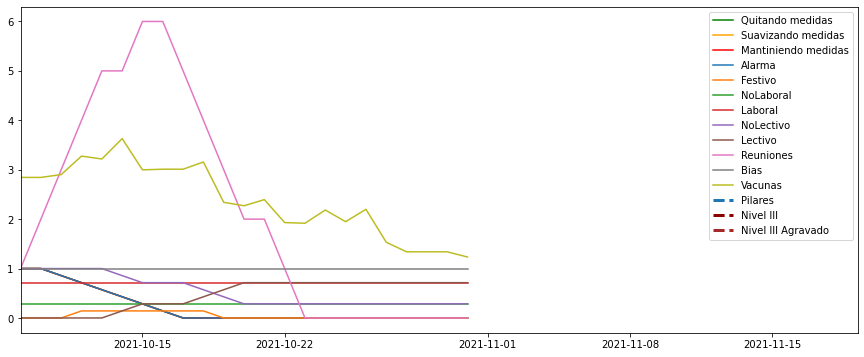

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
U1.loc['2021-10-12','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
#U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
#U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
U1.loc['2021-10-9':'2021-10-13','Reuniones']=7
U1.loc['2021-10-15':'2021-10-16','Reuniones']=7

U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
U1.loc['2021-10-9':'2021-10-13','Lectivo']=0
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 1.91 µs


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-09,52.285714,1650.714286,3.490002,30.557143,61.142857,38.857143,76.233906,8.571428,3.571428,4.714285,...,39.974280,87.717254,88.898559,81.218164,86.110863,89.022972,88.581780,89.182515,91.142297,88.903702
2021-10-10,62.397982,1695.179549,3.588401,39.635893,61.932823,46.128694,76.673824,10.008503,11.354636,5.415558,...,39.931781,87.705351,88.901023,81.197709,86.120173,89.017979,88.584010,89.157366,91.123791,88.899410
2021-10-11,75.720528,1755.966591,3.664483,49.593019,62.607619,56.160508,77.078898,11.682721,19.922252,6.699275,...,39.885697,87.698645,88.894148,81.178184,86.116520,89.011764,88.577544,89.151500,91.115392,88.894222
2021-10-12,91.754860,1834.927046,3.700157,60.309699,63.155661,68.285037,77.405054,13.534209,28.956682,8.517843,...,39.836023,87.692067,88.885564,81.153075,86.112395,89.005988,88.572909,89.147153,91.108409,88.889846
2021-10-13,101.042062,1873.942193,3.731491,67.454651,63.422203,77.713719,78.204837,14.803471,35.697418,9.868683,...,39.784914,87.686065,88.882041,81.117972,86.126193,89.000977,88.564004,89.137251,91.100643,88.900062
2021-10-14,110.808599,1926.251011,3.694600,74.677295,63.638781,87.040598,78.866054,16.141879,42.104130,11.448365,...,39.729782,87.682048,88.873769,81.085799,86.126254,88.998379,88.564113,89.136303,91.096290,88.903518
2021-10-15,119.951298,2004.779776,3.491675,82.426378,63.787045,94.990397,79.323396,17.474420,47.685381,13.418608,...,39.677142,87.677067,88.863275,81.048205,86.126453,88.994892,88.558463,89.133683,91.094837,88.912778
2021-10-16,128.996441,2105.787166,3.160809,89.656310,63.738722,101.835673,79.475104,18.881427,53.146783,15.544532,...,39.621419,87.672790,88.849894,81.009332,86.121366,88.992095,88.557742,89.135472,91.094486,88.917987
2021-10-17,137.046849,2208.869174,2.769217,96.330072,63.664761,107.955617,79.691865,20.275179,57.094887,17.670319,...,39.567237,87.667362,88.836753,80.965566,86.121152,88.989801,88.558948,89.134449,91.092688,88.924404
2021-10-18,142.428826,2306.720357,2.307553,102.353280,63.640997,112.425569,80.121366,21.500345,58.689863,19.689083,...,39.519812,87.660557,88.823974,80.918436,86.123029,88.986189,88.557177,89.130434,91.090729,88.935085


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-09,52.285714,1650.714286,3.490002,30.557143,61.142857,38.857143,76.233906,8.571428,3.571428,4.714285,...,39.974280,87.717254,88.898559,81.218164,86.110863,89.022972,88.581780,89.182515,91.142297,88.903702
2021-10-10,58.052058,1671.519440,3.295580,34.921653,61.332594,42.381883,76.175270,9.755502,4.025687,5.108866,...,39.887392,87.709294,88.893368,81.212677,86.103377,89.016610,88.579757,89.170080,91.134580,88.895906
2021-10-11,64.549404,1703.959021,3.074059,38.714347,61.297081,46.305496,76.032234,11.047975,4.420518,5.424268,...,39.796819,87.702833,88.883227,81.208944,86.095170,89.010015,88.575084,89.163957,91.129838,88.884393
2021-10-12,72.286566,1748.479557,2.879393,42.352760,61.037580,50.909087,75.807020,12.435192,5.735511,5.723612,...,39.697675,87.695477,88.874077,81.203031,86.088381,89.002864,88.567869,89.154612,91.123836,88.876662
2021-10-13,72.760942,1745.968242,2.771004,41.842533,60.391933,52.219583,76.033653,13.175703,5.694797,5.194277,...,39.584215,87.688264,88.871475,81.190871,86.099525,88.995358,88.551886,89.137435,91.115728,88.885720
2021-10-14,74.098097,1751.768977,2.693971,41.700617,59.771091,53.673927,76.162464,13.936490,6.778656,4.707257,...,39.464309,87.683205,88.863216,81.185684,86.098319,88.990841,88.546030,89.129912,91.110161,88.883913
2021-10-15,76.276920,1781.661709,2.557639,42.696244,59.069470,54.785465,76.076135,14.673805,8.867053,4.657900,...,39.333222,87.676970,88.854974,81.176185,86.097661,88.984084,88.529580,89.118602,91.106567,88.892325
2021-10-16,80.473701,1836.653919,2.391483,44.958292,58.462745,56.571642,75.808776,15.492341,13.054611,4.952357,...,39.210759,87.672133,88.841205,81.167470,86.094718,88.980135,88.524216,89.114986,91.103613,88.887874
2021-10-17,86.735583,1900.717041,2.256845,48.544152,57.946290,60.023697,75.646967,16.359079,18.094667,5.671984,...,39.086295,87.666085,88.830773,81.151372,86.097459,88.975291,88.515789,89.106499,91.098471,88.891257
2021-10-18,93.879646,1970.088855,2.136855,53.685940,57.595513,64.670838,75.759295,17.153689,23.228907,6.846688,...,38.965206,87.658433,88.821589,81.128307,86.103709,88.968864,88.503552,89.094654,91.092557,88.899920


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-09,52.285714,1650.714286,3.490002,30.557143,61.142857,38.857143,76.233906,8.571428,3.571428,4.714285,...,39.974280,87.717254,88.898559,81.218164,86.110863,89.022972,88.581780,89.182515,91.142297,88.903702
2021-10-10,58.052058,1671.519440,3.295580,34.921653,61.332594,42.381883,76.175270,9.755502,4.025687,5.108866,...,39.887392,87.709294,88.893368,81.212677,86.103377,89.016610,88.579757,89.170080,91.134580,88.895906
2021-10-11,64.549404,1703.959021,3.074059,38.714347,61.297081,46.305496,76.032234,11.047975,4.420518,5.424268,...,39.796819,87.702833,88.883227,81.208944,86.095170,89.010015,88.575084,89.163957,91.129838,88.884393
2021-10-12,72.286566,1748.479557,2.879393,42.352760,61.037580,50.909087,75.807020,12.435192,5.735511,5.723612,...,39.697675,87.695477,88.874077,81.203031,86.088381,89.002864,88.567869,89.154612,91.123836,88.876662
2021-10-13,72.760942,1745.968242,2.771004,41.842533,60.391933,52.219583,76.033653,13.175703,5.694797,5.194277,...,39.584215,87.688264,88.871475,81.190871,86.099525,88.995358,88.551886,89.137435,91.115728,88.885720
2021-10-14,74.098097,1751.768977,2.693971,41.700617,59.771091,53.673927,76.162464,13.936490,6.778656,4.707257,...,39.464309,87.683205,88.863216,81.185684,86.098319,88.990841,88.546030,89.129912,91.110161,88.883913
2021-10-15,76.276920,1781.661709,2.557639,42.696244,59.069470,54.785465,76.076135,14.673805,8.867053,4.657900,...,39.333222,87.676970,88.854974,81.176185,86.097661,88.984084,88.529580,89.118602,91.106567,88.892325
2021-10-16,80.473701,1836.653919,2.391483,44.958292,58.462745,56.571642,75.808776,15.492341,13.054611,4.952357,...,39.210759,87.672133,88.841205,81.167470,86.094718,88.980135,88.524216,89.114986,91.103613,88.887874
2021-10-17,86.735583,1900.717041,2.256845,48.544152,57.946290,60.023697,75.646967,16.359079,18.094667,5.671984,...,39.086295,87.666085,88.830773,81.151372,86.097459,88.975291,88.515789,89.106499,91.098471,88.891257
2021-10-18,93.879646,1970.088855,2.136855,53.685940,57.595513,64.670838,75.759295,17.153689,23.228907,6.846688,...,38.965206,87.658433,88.821589,81.128307,86.103709,88.968864,88.503552,89.094654,91.092557,88.899920


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-09,52.285714,1650.714286,3.490002,30.557143,61.142857,38.857143,76.233906,8.571428,3.571428,4.714285,...,39.974280,87.717254,88.898559,81.218164,86.110863,89.022972,88.581780,89.182515,91.142297,88.903702
2021-10-10,58.052058,1671.519440,3.295580,34.921653,61.332594,42.381883,76.175270,9.755502,4.025687,5.108866,...,39.887392,87.709294,88.893368,81.212677,86.103377,89.016610,88.579757,89.170080,91.134580,88.895906
2021-10-11,64.549404,1703.959021,3.074059,38.714347,61.297081,46.305496,76.032234,11.047975,4.420518,5.424268,...,39.796819,87.702833,88.883227,81.208944,86.095170,89.010015,88.575084,89.163957,91.129838,88.884393
2021-10-12,72.286566,1748.479557,2.879393,42.352760,61.037580,50.909087,75.807020,12.435192,5.735511,5.723612,...,39.697675,87.695477,88.874077,81.203031,86.088381,89.002864,88.567869,89.154612,91.123836,88.876662
2021-10-13,72.760942,1745.968242,2.771004,41.842533,60.391933,52.219583,76.033653,13.175703,5.694797,5.194277,...,39.584215,87.688264,88.871475,81.190871,86.099525,88.995358,88.551886,89.137435,91.115728,88.885720
2021-10-14,74.098097,1751.768977,2.693971,41.700617,59.771091,53.673927,76.162464,13.936490,6.778656,4.707257,...,39.464309,87.683205,88.863216,81.185684,86.098319,88.990841,88.546030,89.129912,91.110161,88.883913
2021-10-15,76.276920,1781.661709,2.557639,42.696244,59.069470,54.785465,76.076135,14.673805,8.867053,4.657900,...,39.333222,87.676970,88.854974,81.176185,86.097661,88.984084,88.529580,89.118602,91.106567,88.892325
2021-10-16,80.473701,1836.653919,2.391483,44.958292,58.462745,56.571642,75.808776,15.492341,13.054611,4.952357,...,39.210759,87.672133,88.841205,81.167470,86.094718,88.980135,88.524216,89.114986,91.103613,88.887874
2021-10-17,86.735583,1900.717041,2.256845,48.544152,57.946290,60.023697,75.646967,16.359079,18.094667,5.671984,...,39.086295,87.666085,88.830773,81.151372,86.097459,88.975291,88.515789,89.106499,91.098471,88.891257
2021-10-18,93.879646,1970.088855,2.136855,53.685940,57.595513,64.670838,75.759295,17.153689,23.228907,6.846688,...,38.965206,87.658433,88.821589,81.128307,86.103709,88.968864,88.503552,89.094654,91.092557,88.899920


CPU times: user 75.7 ms, sys: 3.25 ms, total: 78.9 ms
Wall time: 78.5 ms


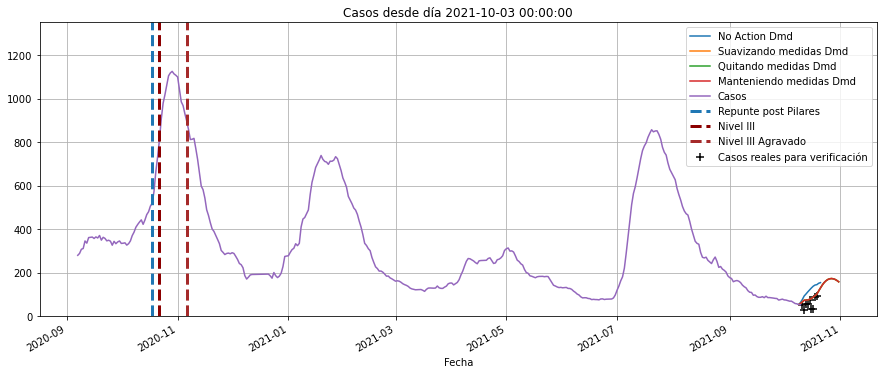

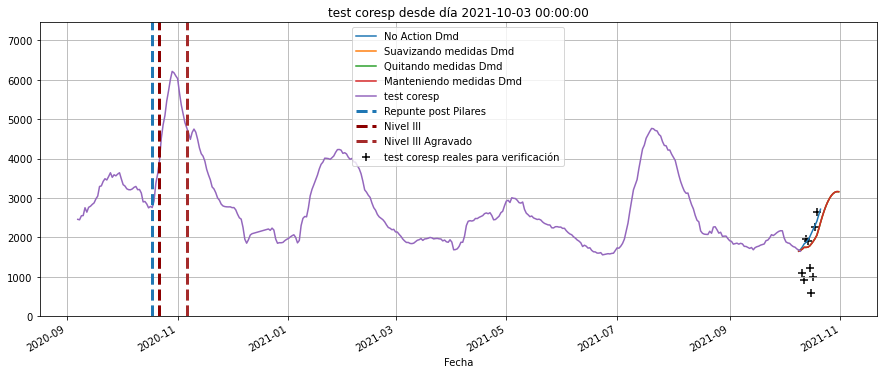

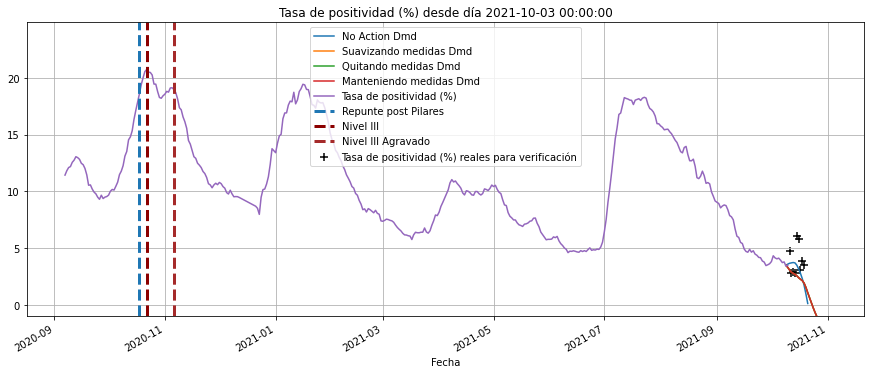

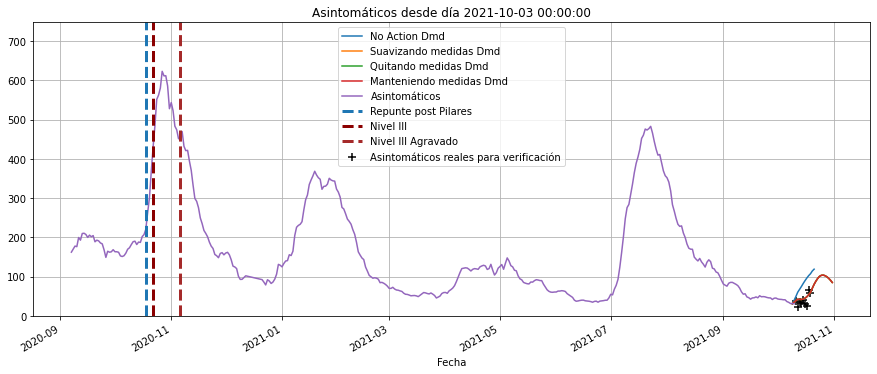

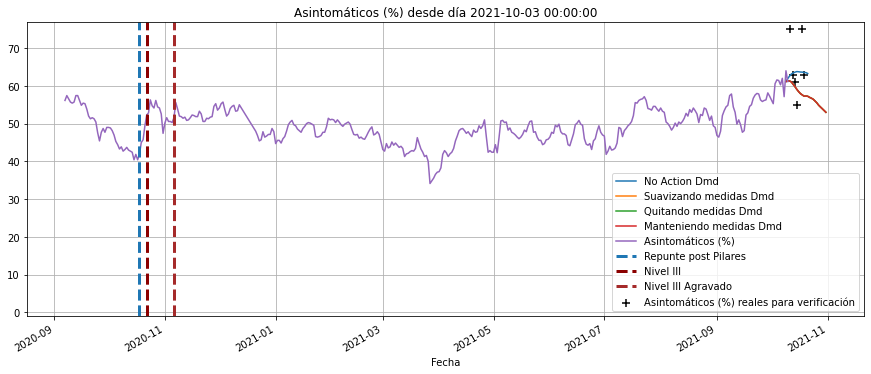

...

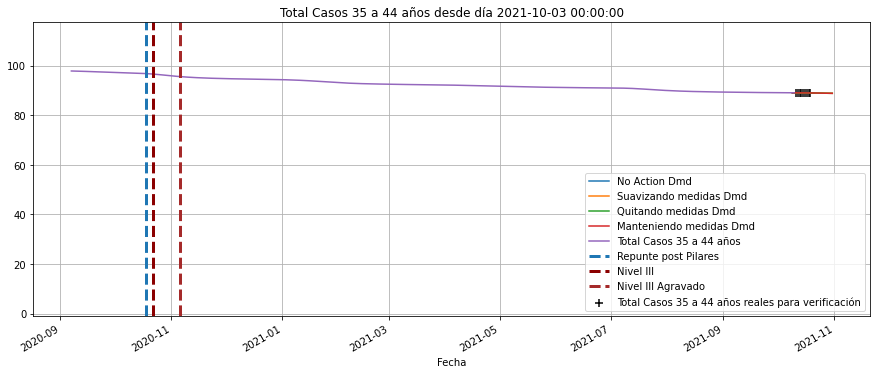

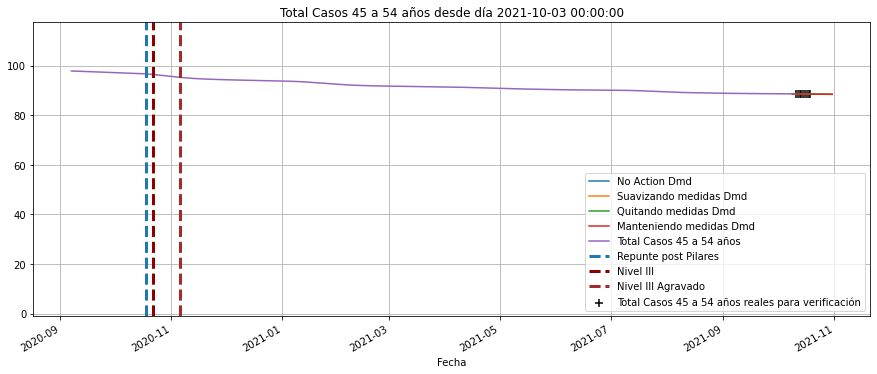

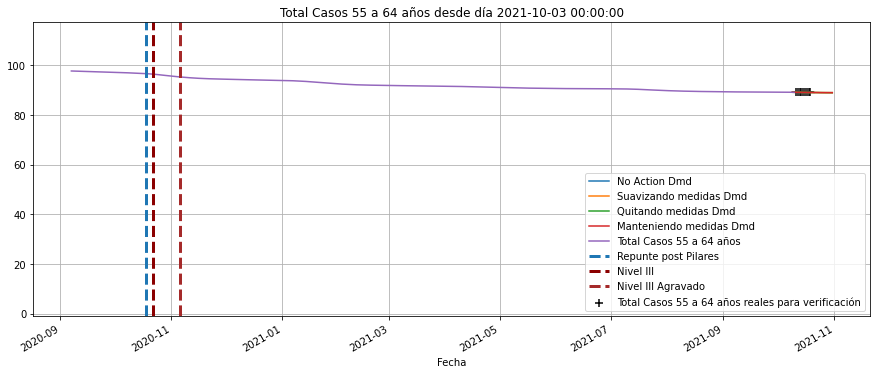

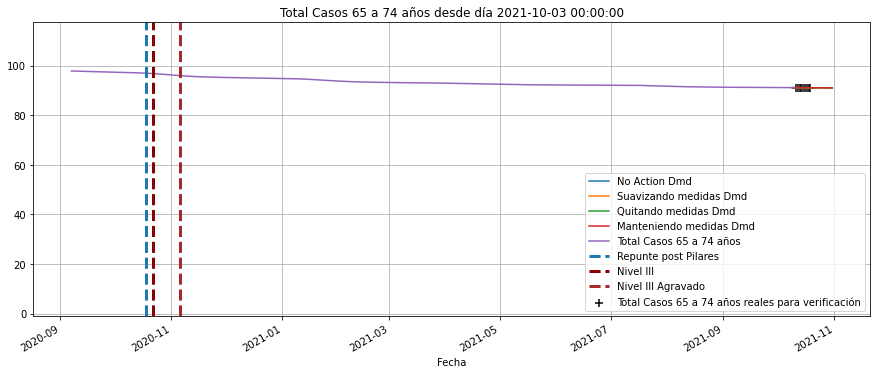

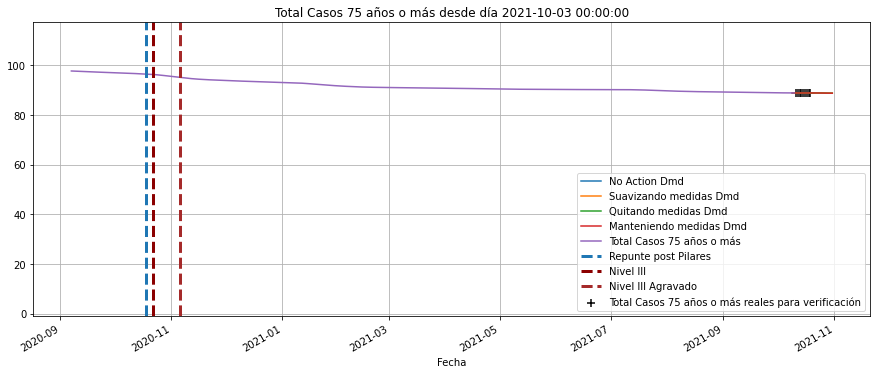

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

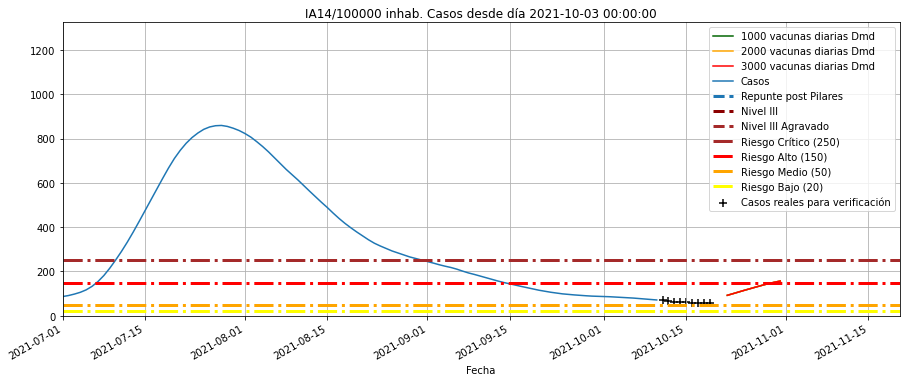

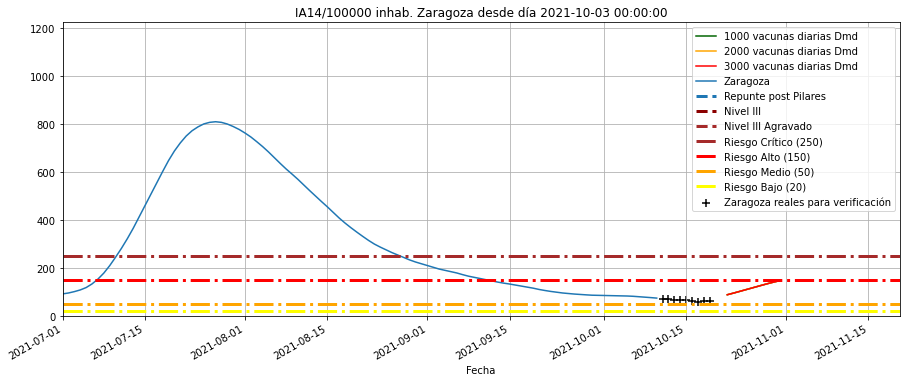

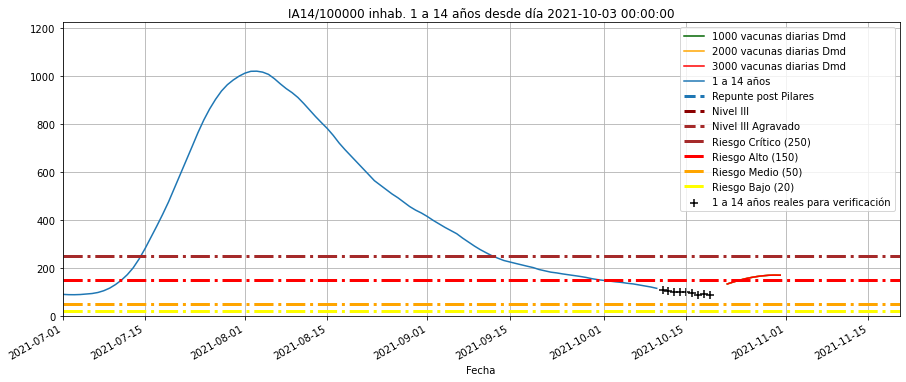

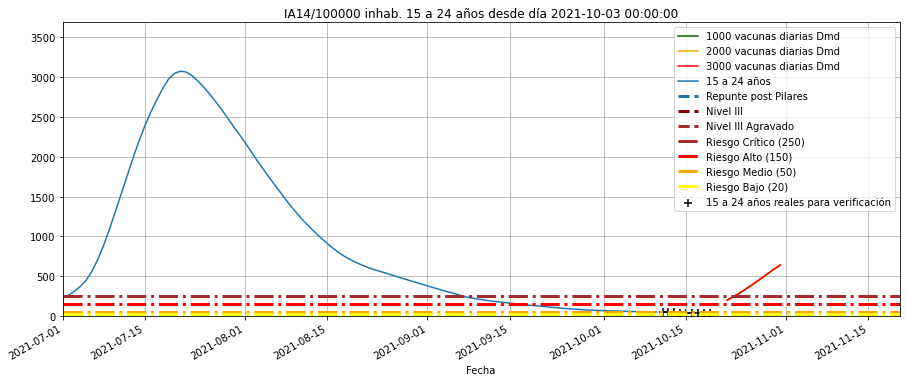

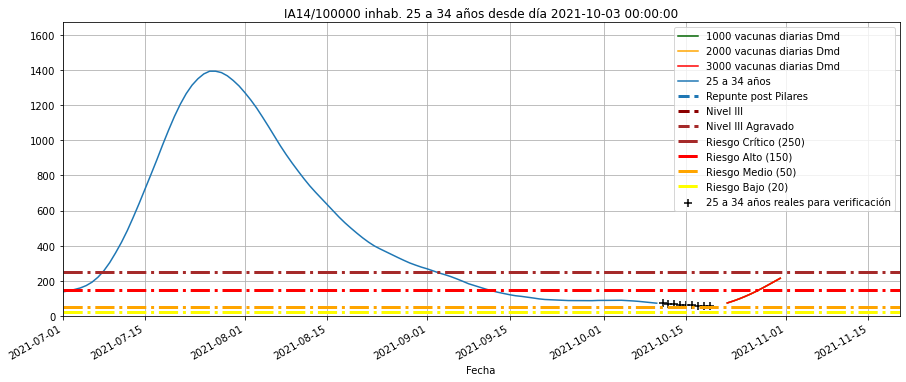

...

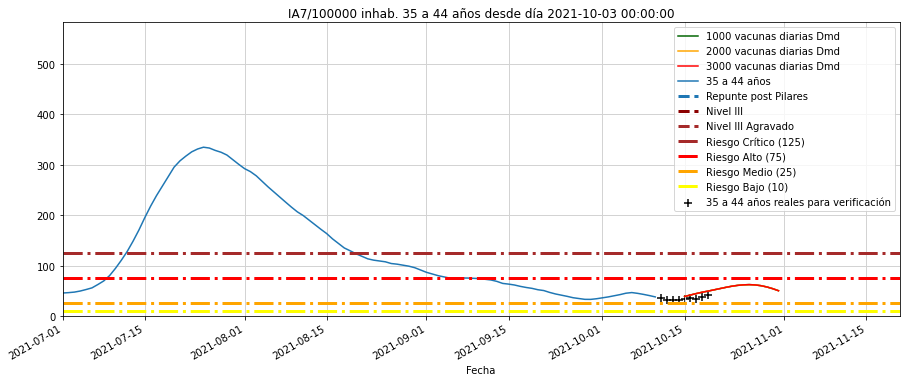

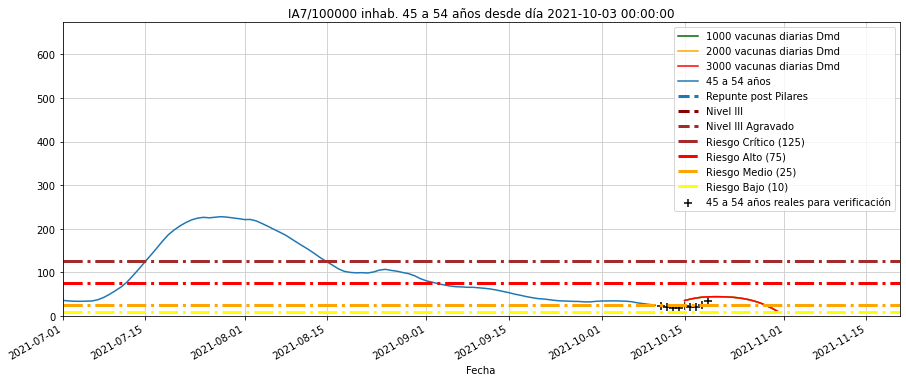

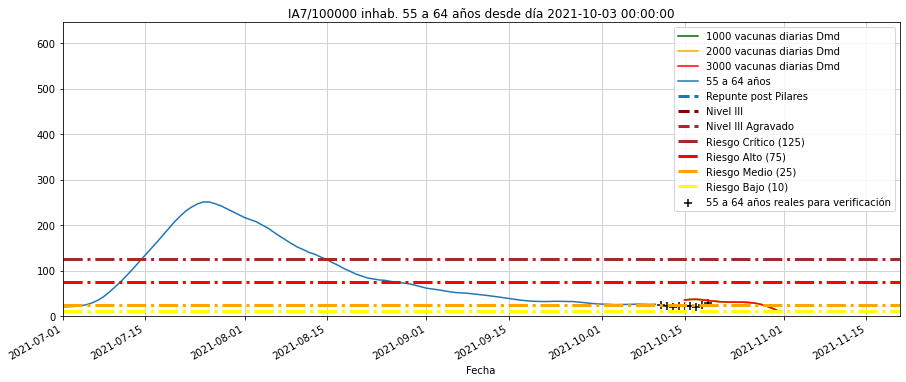

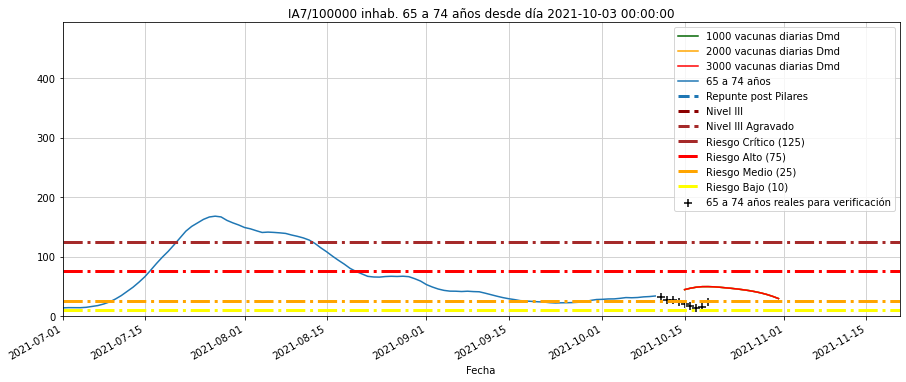

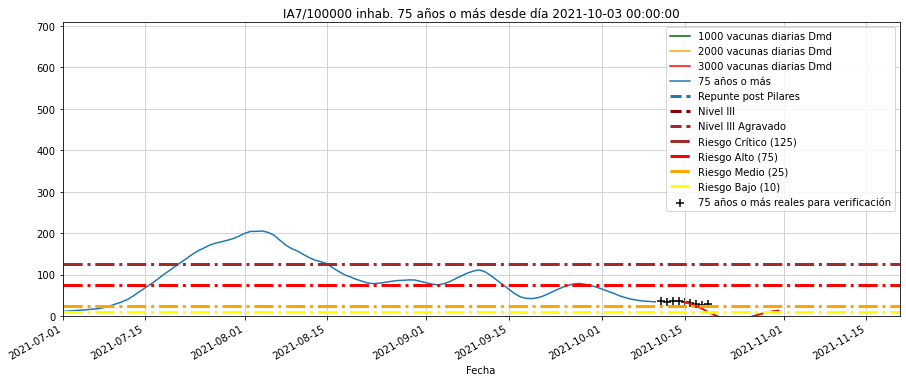

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-17,7,30.0,984.0,NaN,3.05,24.00,25.0,5.0,1.0,2.0,...,39.100175,87.681783,88.853912,81.199007,86.075825,88.979842,88.554159,89.155210,91.119204,88.863692
2021-10-18,1,87.0,2256.0,NaN,3.86,65.25,70.0,15.0,2.0,10.0,...,39.027563,87.675189,88.845784,81.197392,86.068769,88.971366,88.545914,89.147858,91.114765,88.859703
2021-10-19,2,93.0,2649.0,NaN,3.51,58.59,63.0,10.0,5.0,9.0,...,39.027563,87.668140,88.840365,81.193356,86.062418,88.963389,88.535243,89.142203,91.105149,88.854385
2021-10-20,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.802241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-10-21,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.684954,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

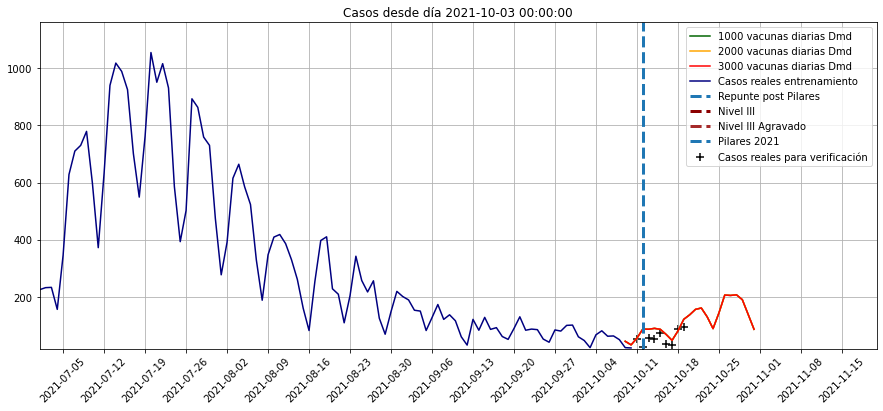

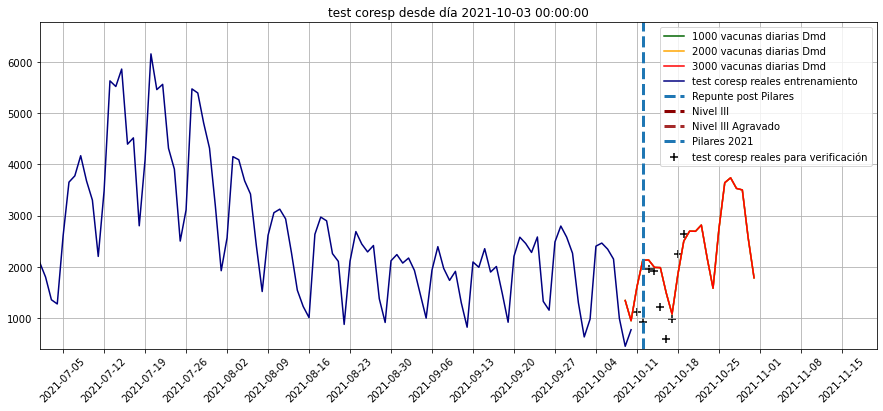

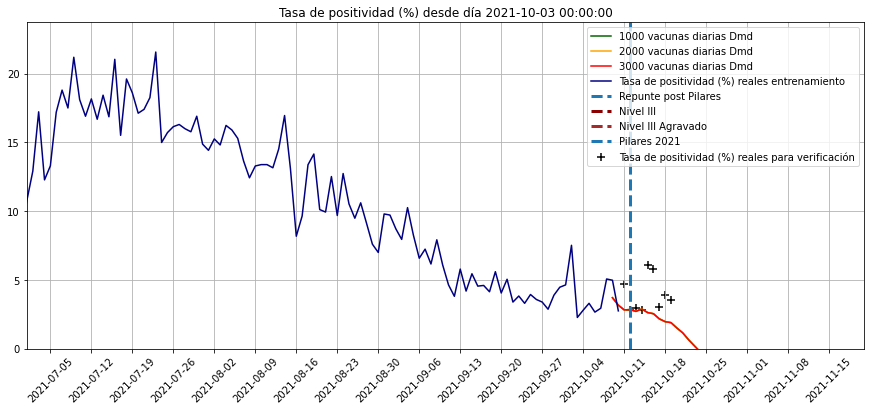

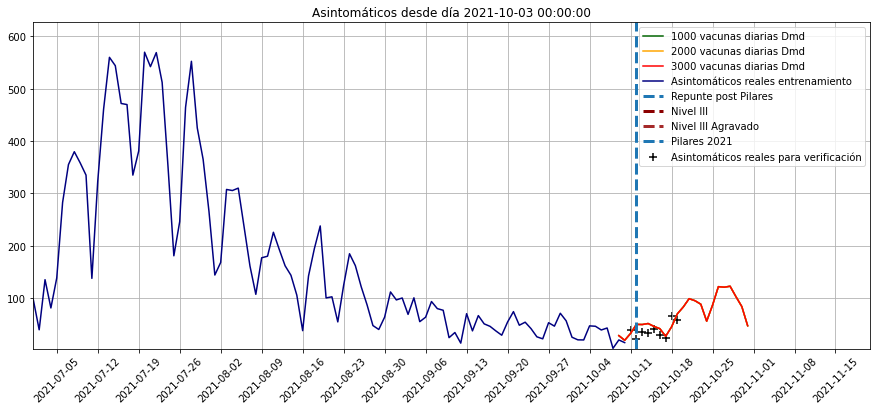

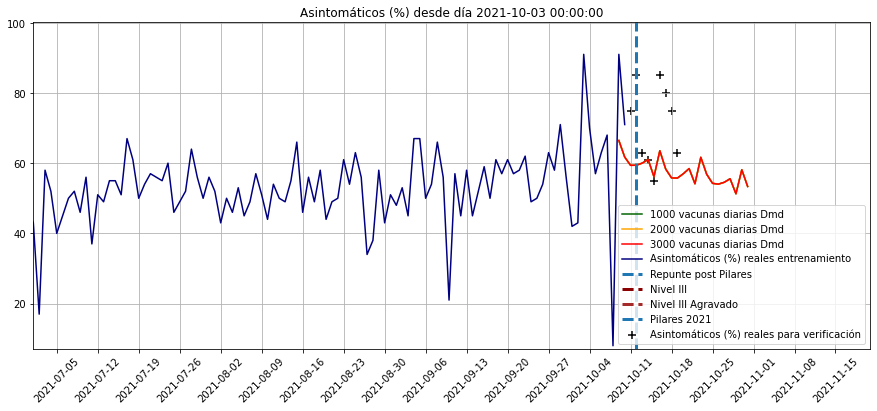

...

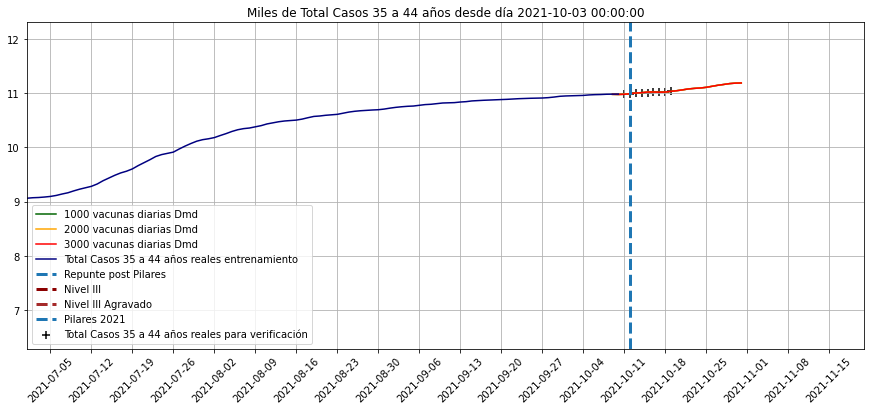

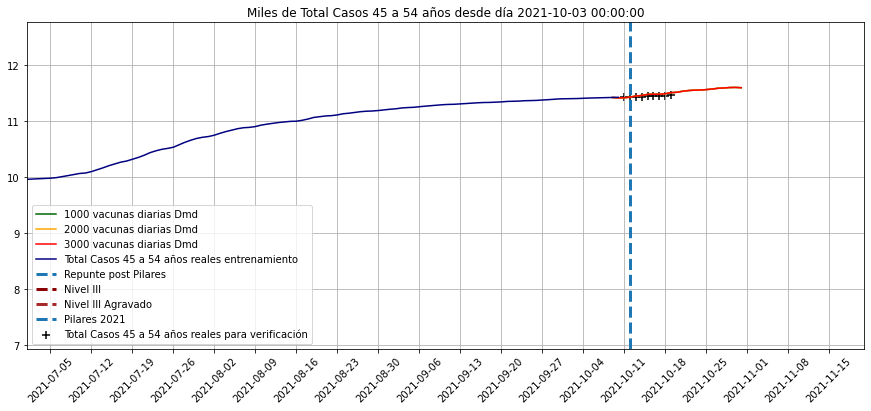

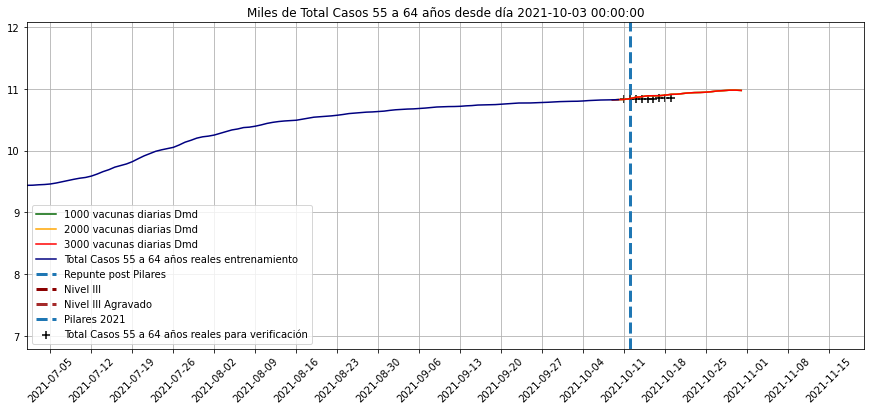

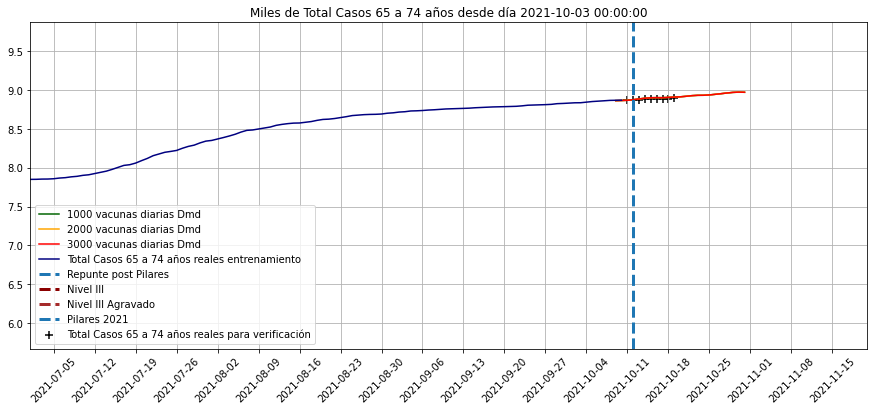

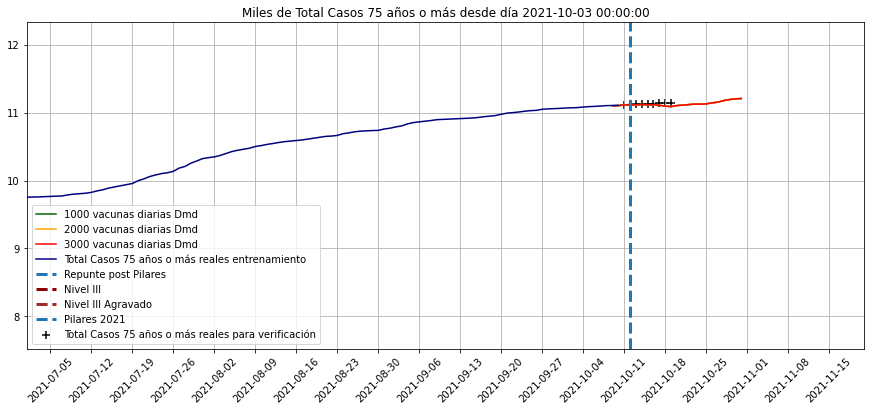

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index
kControl2.loc['Nº de pacientes a los que se ha realizado pruebas']=0

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-10-13':'2021-10-24'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas',
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-10-13':'2021-10-24'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-10-24,89,1578,0,0,57,58,11,80,92,1237,10,29,12,10,6,4,5,0
2021-10-23,130,2167,0,0,62,89,12,73,91,1267,20,45,17,15,10,7,7,-1
2021-10-22,161,2814,0,1,54,105,12,71,92,1258,24,56,20,21,14,8,10,-2
2021-10-21,156,2692,0,1,58,103,13,70,100,1150,24,53,17,20,15,10,11,-3
2021-10-20,137,2696,0,1,57,93,13,71,104,1132,23,44,13,20,15,9,11,-3
2021-10-19,121,2500,0,2,56,83,13,72,109,1137,23,33,10,20,16,9,10,-3
2021-10-18,80,1853,0,2,56,50,13,74,111,1169,12,19,6,13,12,7,8,-1
2021-10-17,48,1072,0,2,58,32,13,80,111,1311,8,9,3,8,7,4,5,0
2021-10-16,68,1489,0,3,64,50,13,76,102,1350,14,11,4,12,11,7,8,2
2021-10-15,86,1982,0,3,56,62,12,78,97,1345,17,10,5,15,15,10,11,5


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más,Nº de pacientes a los que se ha realizado pruebas
2021-10-09,44.176733,1338.044750,3.695998,28.262713,66.460184,34.520363,80.137201,7.936564,2.951897,3.914686,...,87.717254,88.891749,81.207812,86.104636,89.018828,88.577289,89.178773,91.138770,88.899513,0.0
2021-10-10,31.798368,942.975818,3.154924,19.388030,61.739423,22.854403,75.145382,4.566090,2.022073,2.713697,...,87.709294,88.896937,81.219460,86.108481,89.020902,88.584379,89.174280,91.137017,88.897665,0.0
2021-10-11,55.137969,1602.557898,2.812691,32.403750,59.385906,36.047611,69.611314,8.043882,3.541130,4.542866,...,87.702833,88.892613,81.224492,86.105043,89.017985,88.582703,89.171176,91.134331,88.889555,0.0
2021-10-12,87.084139,2127.808402,2.834792,49.755150,59.408994,61.583854,75.854462,15.747545,6.755182,6.867151,...,87.695477,88.879160,81.212768,86.093370,89.006233,88.571604,89.157495,91.126718,88.880030,0.0
2021-10-13,86.458640,2130.642130,2.701738,49.454943,60.020404,63.063466,77.353342,15.919994,7.101308,6.173737,...,87.688264,88.872102,81.191839,86.099811,88.994464,88.551386,89.136402,91.116372,88.887389,0.0


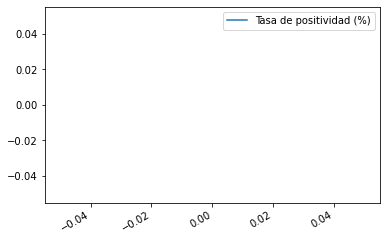

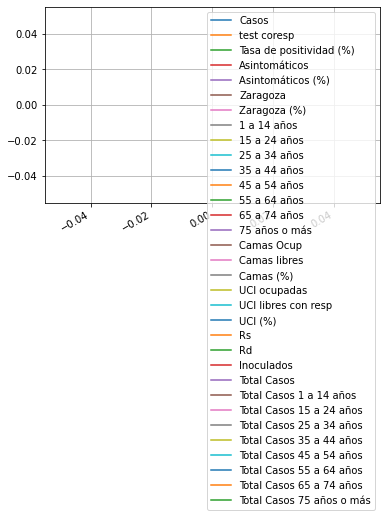

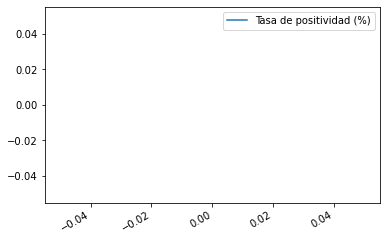

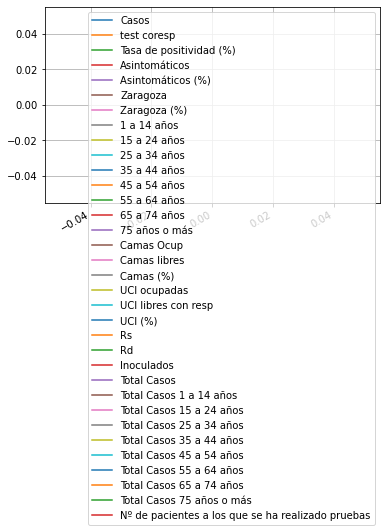

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-10-06     2.646180
2021-10-07     2.931596
2021-10-08     5.055612
2021-10-09     4.966140
2021-10-10     2.737940
Length: 375, dtype: float64

<AxesSubplot:xlabel='Fecha'>

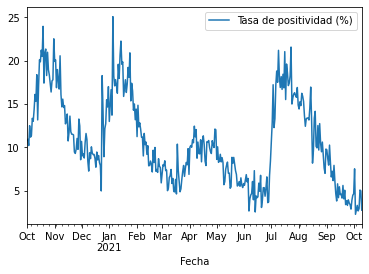

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,9.0,72.620296,95.129363,-16.737526,14.912603,53.138229,104.926609,293.688633
15 a 24 años,9.0,inf,NaN,-40.981166,158.101638,560.942143,830.395179,inf
25 a 34 años,9.0,58.233718,200.820519,-49.523715,-39.458093,2.809440,14.417410,586.715106
35 a 44 años,9.0,25.300592,28.327931,-20.991860,10.590756,27.301968,34.806942,83.837686
45 a 54 años,9.0,131.646259,196.930631,-30.032194,4.508279,83.770715,176.342702,593.413628
55 a 64 años,9.0,93.901566,133.956845,-49.354146,19.757563,47.566887,97.431363,331.633708
65 a 74 años,9.0,274.328643,302.137747,-20.548996,127.197937,167.355913,317.067965,990.770299
75 años o más,9.0,-36.352255,71.705300,-142.284003,-101.226607,-25.249566,-4.694500,63.631643
Asintomáticos,9.0,28.799959,45.592867,-31.134234,12.296074,19.477632,43.884187,125.136425
Asintomáticos (%),9.0,-15.881984,12.524937,-30.107066,-25.600334,-20.818792,-4.729517,2.084130


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-10-11    0.0
2021-10-12    0.0
2021-10-13    0.0
2021-10-14    0.0
2021-10-15    0.0
2021-10-16    0.0
2021-10-17    NaN
2021-10-18    NaN
2021-10-19    NaN
2021-10-20    NaN
2021-10-21    NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

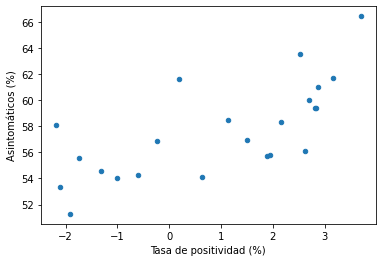

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

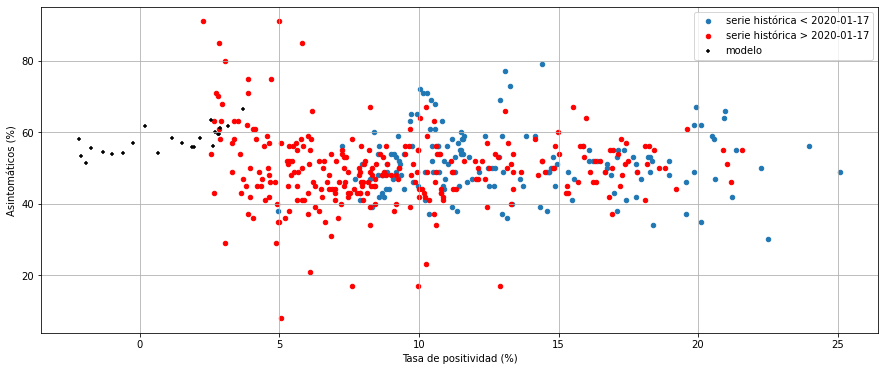

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más',
       'Nº de pacientes a los que se ha realizado pruebas'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-10-12,2021-10-13,2021-10-14,2021-10-15,2021-10-16,2021-10-17,2021-10-18,2021-10-19,2021-10-20,2021-10-21
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,26.000000,57.000000,5.400000e+01,74.000000,34.000000,30.000000,87.000000,93.000000,NaN,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,921.000000,1950.000000,1.907000e+03,1215.000000,584.000000,984.000000,2256.000000,2649.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,2.820000,2.920000,2.830000e+00,6.090000,5.820000,3.050000,3.860000,3.510000,NaN,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,22.100000,35.910000,3.294000e+01,40.700000,28.900000,24.000000,65.250000,58.590000,NaN,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,21.000000,41.000000,4.200000e+01,60.000000,28.000000,25.000000,70.000000,63.000000,NaN,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,4.000000,13.000000,1.100000e+01,17.000000,7.000000,5.000000,15.000000,10.000000,NaN,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,0.000000,3.000000,2.000000e+00,4.000000,1.000000,1.000000,2.000000,5.000000,NaN,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,1.000000,7.000000,5.000000e+00,9.000000,4.000000,2.000000,10.000000,9.000000,NaN,NaN


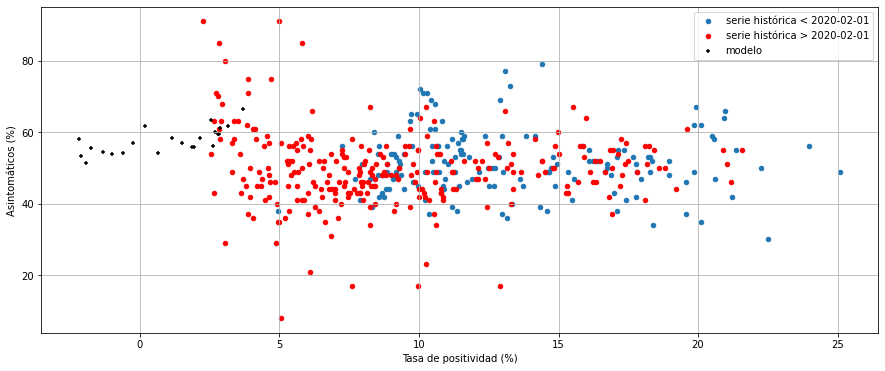

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.000000,-0.007964
Asintomáticos (%),-0.007964,1.000000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

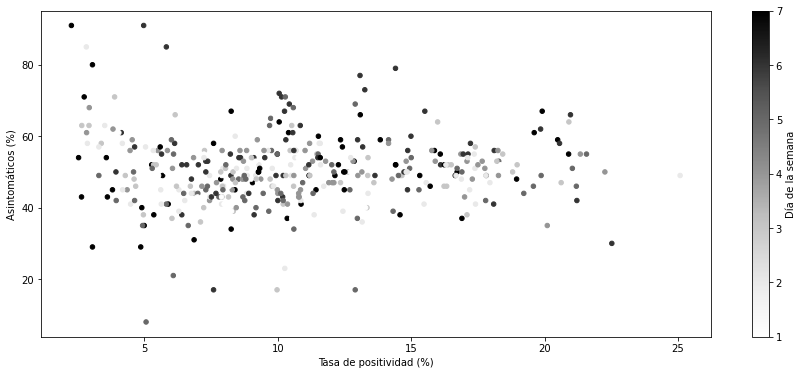

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-10-09,2021-10-10,2021-10-11,2021-10-12,2021-10-13,2021-10-14,2021-10-15,2021-10-16,2021-10-17,2021-10-18,...,2021-10-22,2021-10-23,2021-10-24,2021-10-25,2021-10-26,2021-10-27,2021-10-28,2021-10-29,2021-10-30,2021-10-31
Casos,44.176733,31.798368,55.137969,87.084139,86.458640,89.541173,86.097021,67.993050,47.509944,80.191801,...,160.782858,129.770669,88.638520,143.212478,206.114180,204.762804,206.973397,189.972498,138.225771,86.206114
test coresp,1338.044750,942.975818,1602.557898,2127.808402,2130.642130,1985.811322,1981.607345,1488.764685,1072.276017,1852.850576,...,2814.357896,2166.523101,1578.469924,2731.994821,3643.190063,3738.660503,3531.271811,3501.632595,2564.018016,1782.897779
Tasa de positividad (%),3.695998,3.154924,2.812691,2.834792,2.701738,2.878095,2.617333,2.532640,2.160522,1.955171,...,0.640171,0.194379,-0.243801,-0.602434,-1.010735,-1.317525,-1.745663,-1.915967,-2.183166,-2.105627
Asintomáticos,28.262713,19.388030,32.403750,49.755150,49.454943,51.397074,45.869495,41.582530,26.951058,44.934912,...,94.993406,88.273108,55.849684,86.336841,121.815793,120.791168,122.629339,102.705887,83.838503,47.128518
Asintomáticos (%),66.460184,61.739423,59.385906,59.408994,60.020404,61.042518,56.146272,63.546994,58.330657,55.799749,...,54.137884,61.670832,56.840799,54.253637,54.027234,54.548645,55.562448,51.278299,58.125605,53.355252
Zaragoza,34.520363,22.854403,36.047611,61.583854,63.063466,65.492381,62.147017,50.257776,32.367740,50.344547,...,105.321218,89.352985,57.724676,87.325875,140.211840,142.745850,145.303540,134.554027,103.825654,61.449017
Zaragoza (%),80.137201,75.145382,69.611314,75.854462,77.353342,77.289062,77.089151,79.690304,74.624222,69.361424,...,76.522779,79.756406,75.429904,70.567272,77.783752,79.714274,80.196559,80.728402,84.356678,79.672002
1 a 14 años,7.936564,4.566090,8.043882,15.747545,15.919994,17.115343,17.067141,14.344863,7.656911,12.489371,...,24.019080,19.539341,9.920058,15.289653,26.010262,23.985103,23.288531,20.856841,15.550402,7.292931
15 a 24 años,2.951897,2.022073,3.541130,6.755182,7.101308,8.525847,10.324066,10.790042,9.088817,18.607904,...,56.375526,44.675383,29.417377,50.257508,78.395811,87.206088,91.650516,87.660178,63.759618,39.398343
25 a 34 años,3.914686,2.713697,4.542866,6.867151,6.173737,5.720871,5.448772,4.112378,3.012811,5.734152,...,20.153190,16.620518,11.992236,20.755497,31.967804,33.547070,35.856688,35.747669,26.087574,17.045661


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

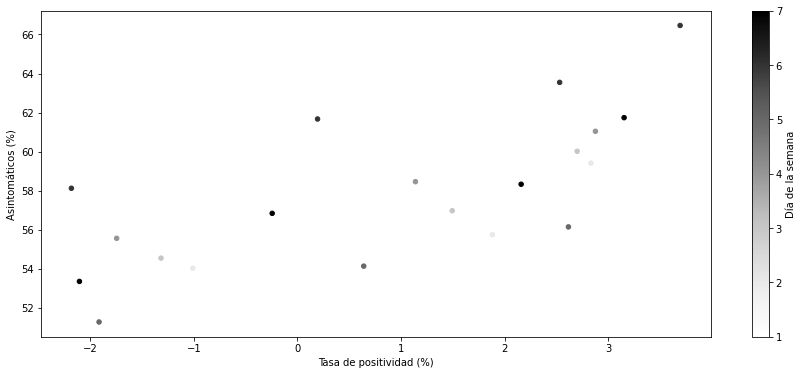

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

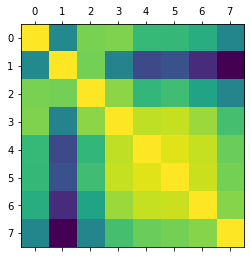

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

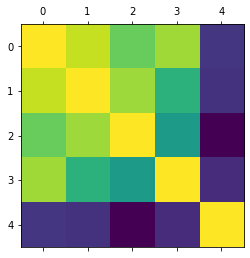

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

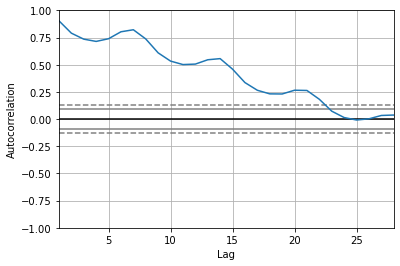

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

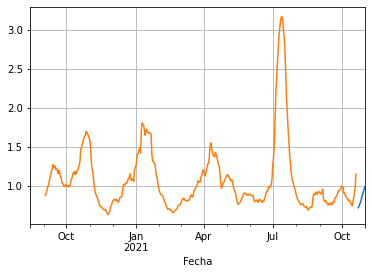

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

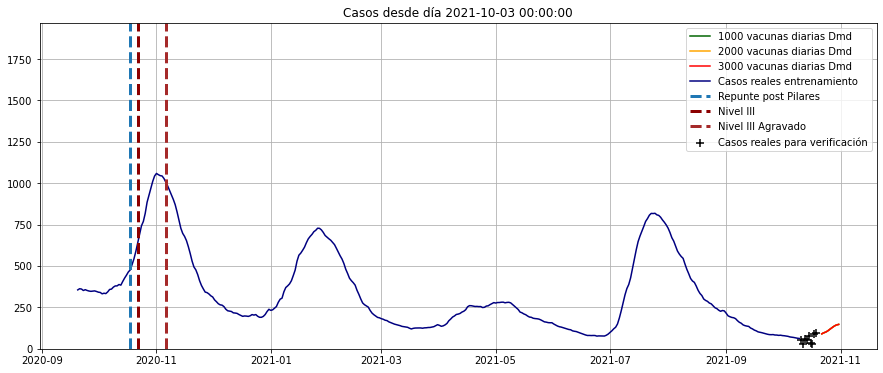

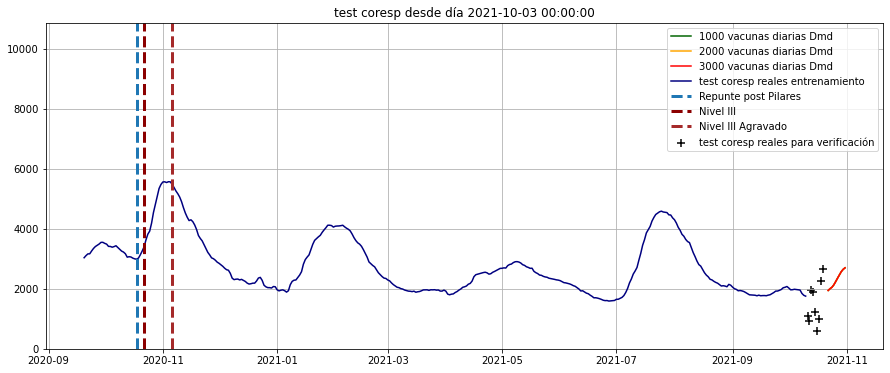

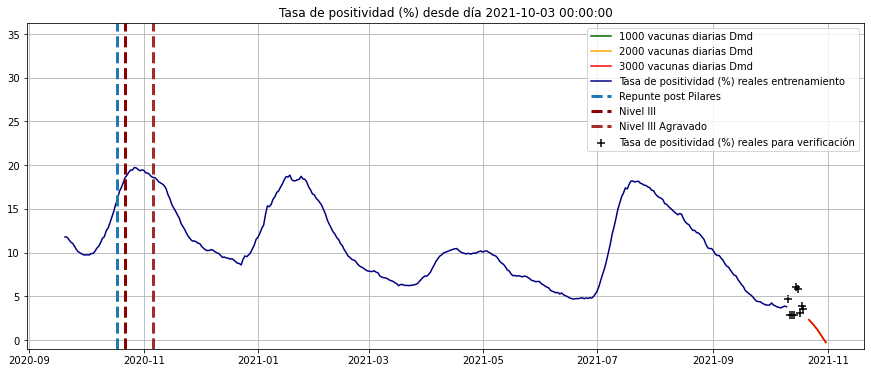

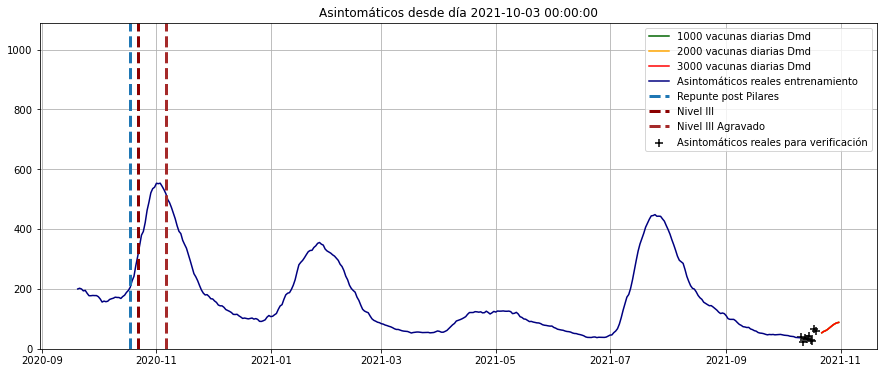

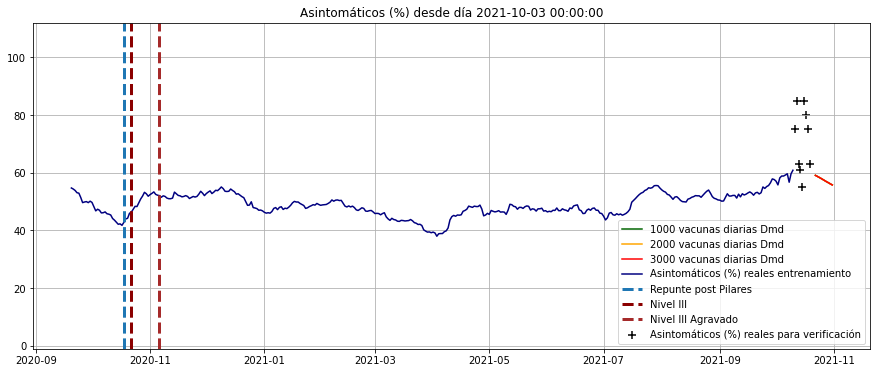

...

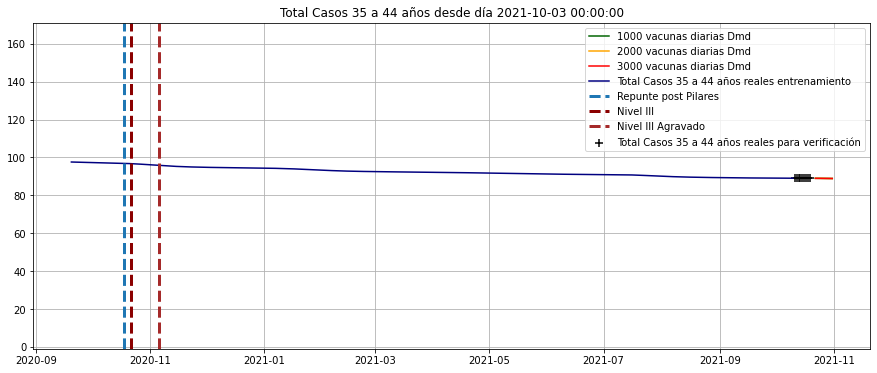

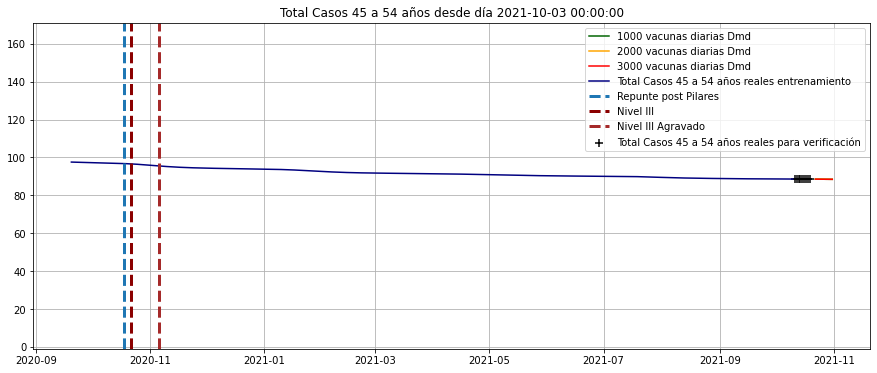

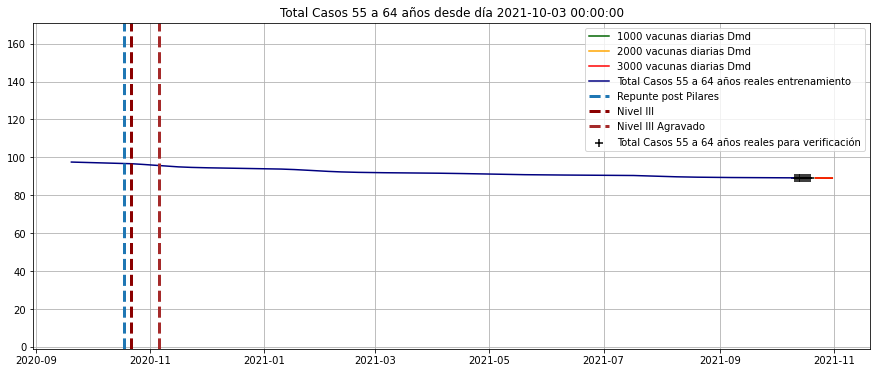

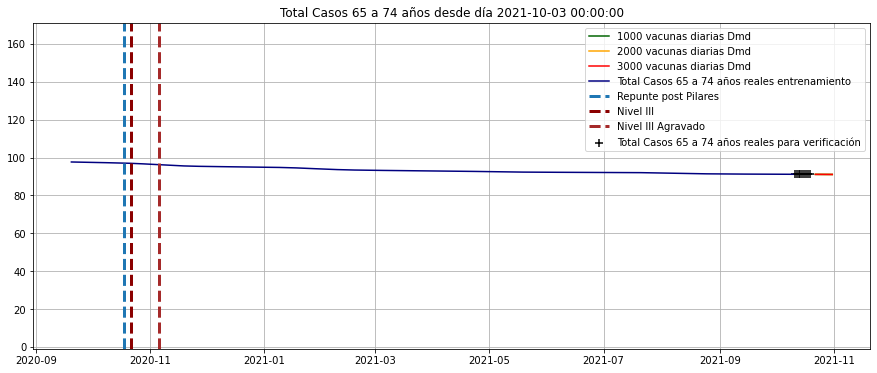

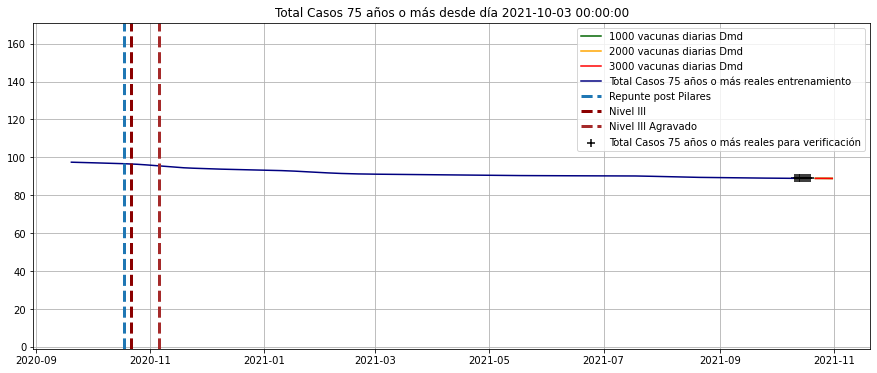

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

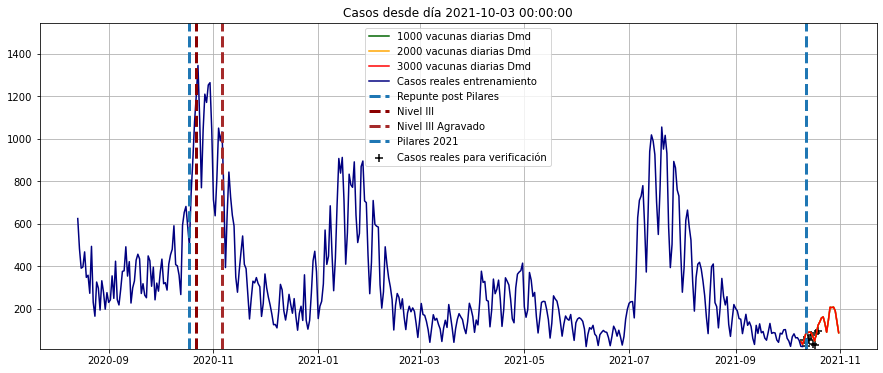

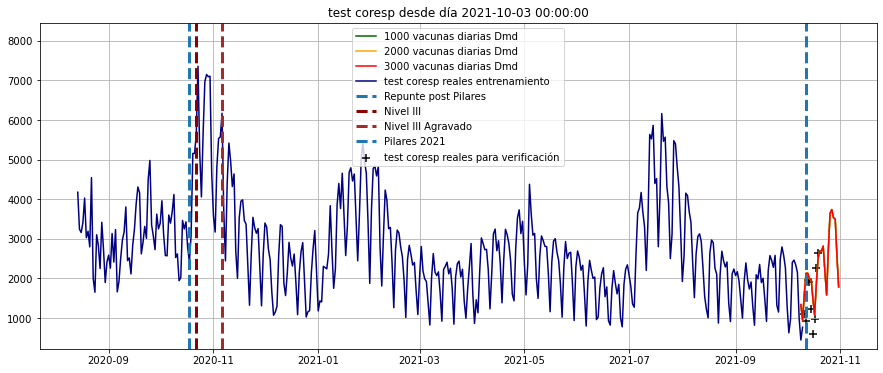

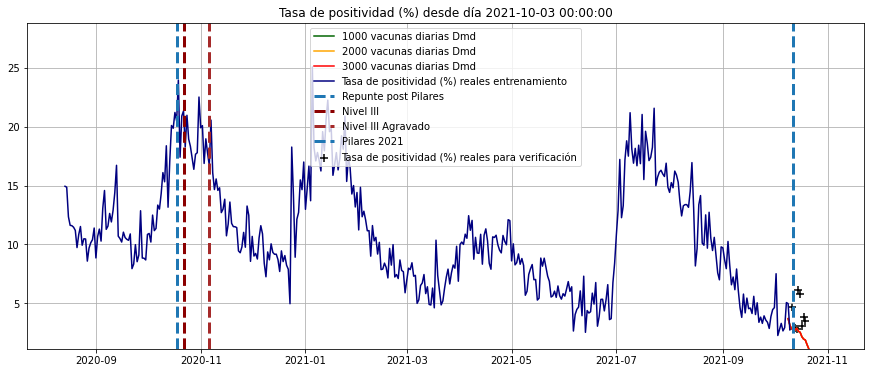

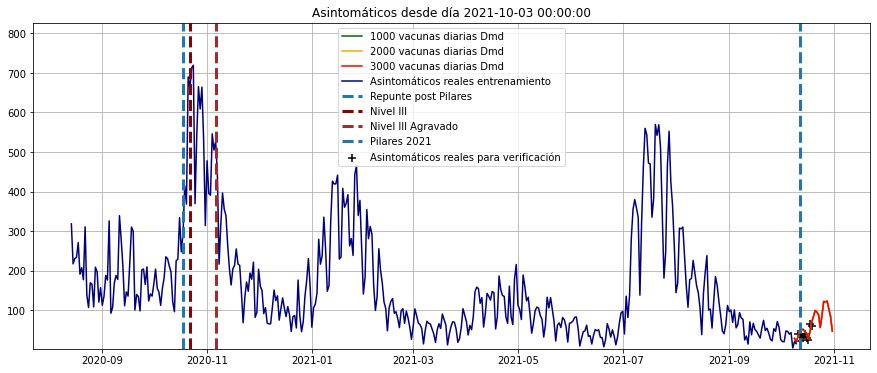

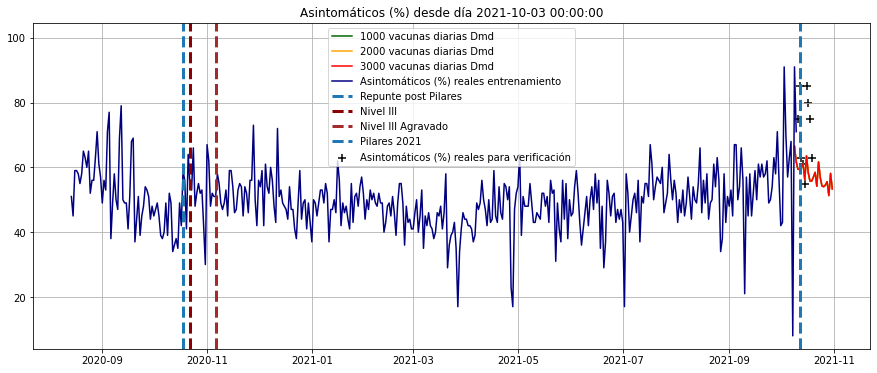

...

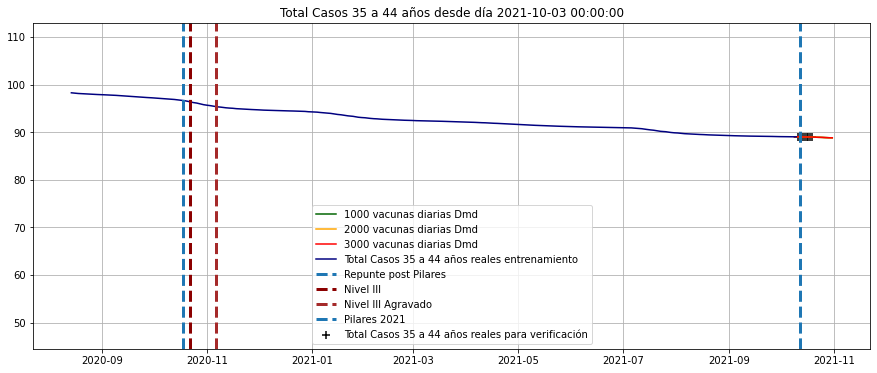

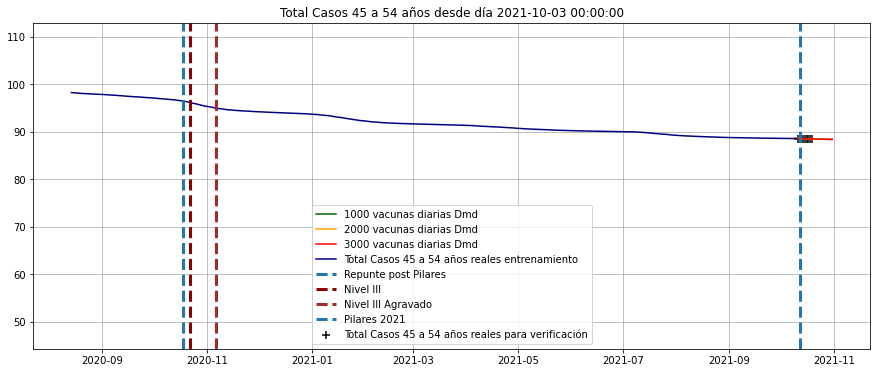

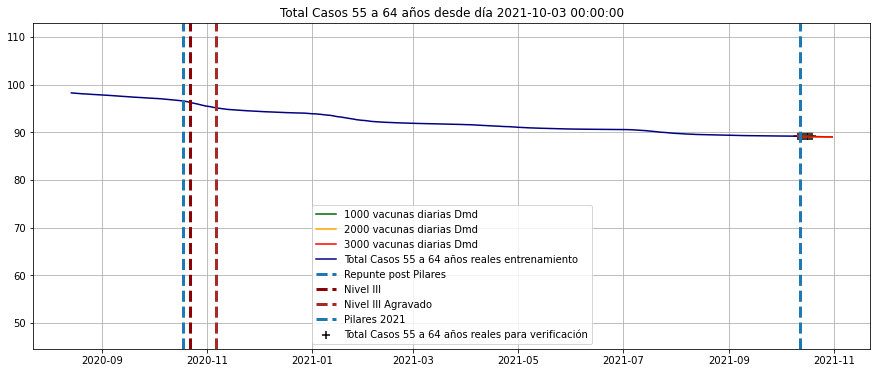

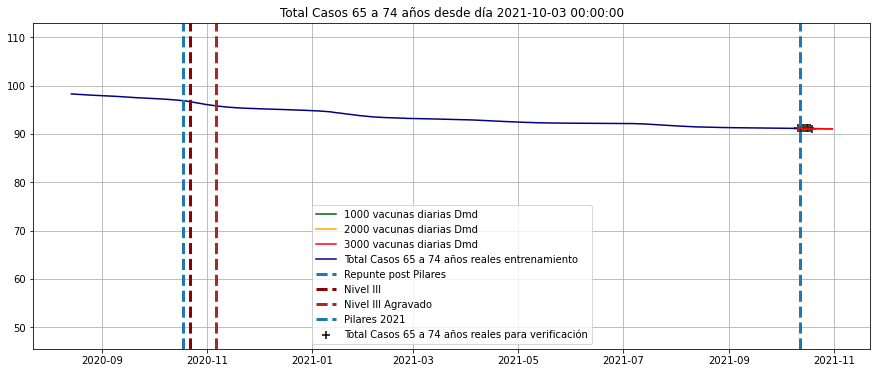

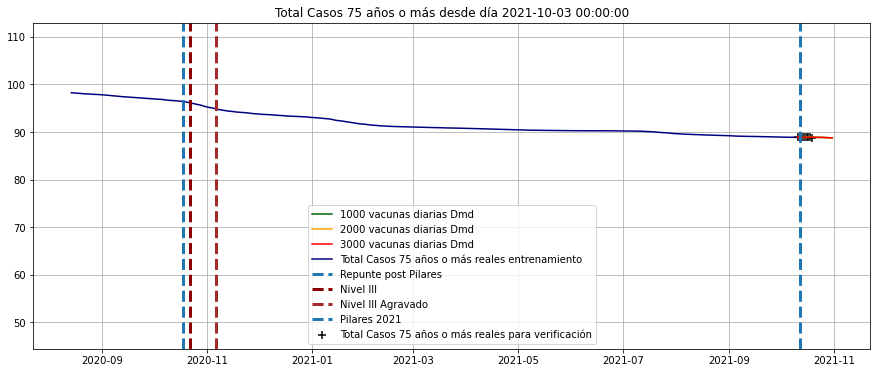

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Asintomáticos (%)
Fecha,,,
2021-03-19,-0.000683,0.000071,0.000280
2021-03-20,-0.000675,0.000036,0.002118
2021-03-21,-0.000464,0.000030,0.001050
2021-03-22,-0.001272,0.000142,-0.000588
2021-03-23,-0.001136,0.000133,-0.000754
2021-03-24,-0.000855,0.000104,-0.000624
2021-03-25,-0.000452,0.000044,0.000470
2021-03-26,-0.000974,0.000118,-0.000813
2021-03-27,-0.000471,0.000067,-0.000916


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Asintomáticos (%)
Casos,0.733844,0.014218,0.622168


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-10-19
Casos,93.0
test coresp,2649.0
Asintomáticos (%),63.0


Fecha,2021-10-20
Casos,145.106917


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,178.992452


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,314.421717
2021-04-18,249.433524
2021-04-19,132.786631
2021-04-20,204.066230


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,427.818624
2020-08-17,396.0,367.806801
2020-08-18,467.0,375.764305
2020-08-19,347.0,436.074300
2020-08-20,357.0,331.900304
...,...,...
2021-10-15,74.0,104.693082
2021-10-16,34.0,105.798271
2021-10-17,30.0,86.138132


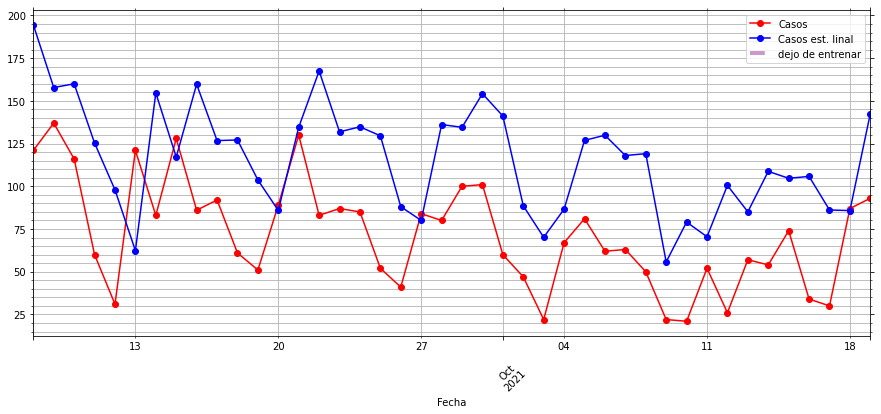

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

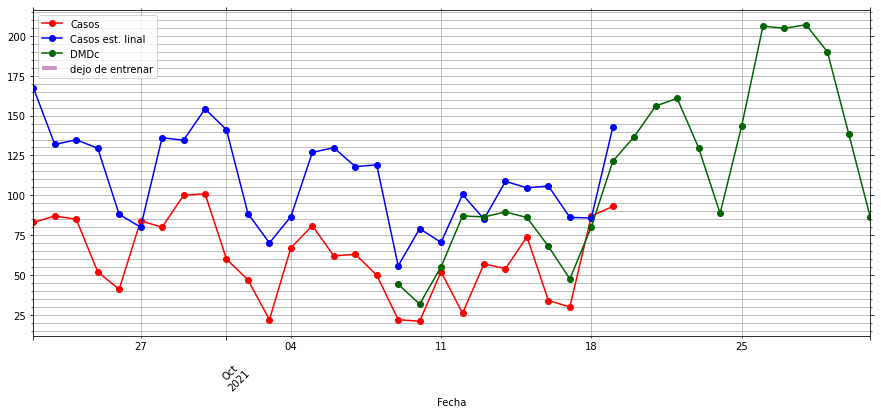

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(16.088162220127522, 116.99904413309027)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      #'Nº de pacientes a los que se ha realizado pruebas',
                      'Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

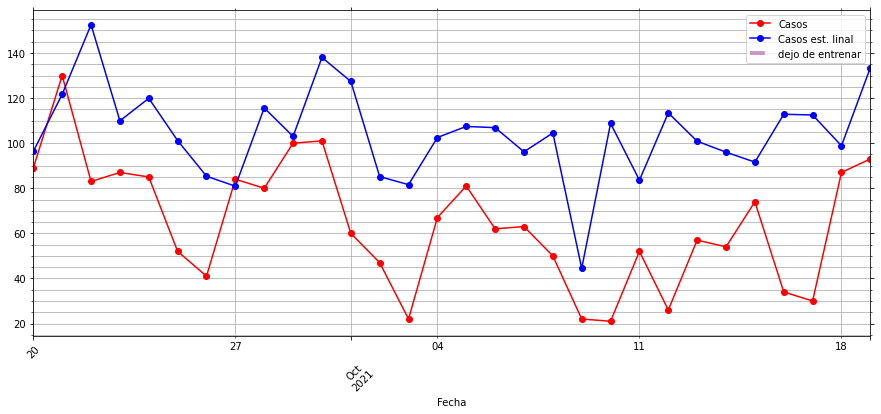

(-6.87113612336282, 111.67004689565427)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-04-05 00:00:00 45.355293991881254 202.01825833676082
2021-04-06 00:00:00 51.52732087525679 205.14312234340161
2021-04-07 00:00:00 56.55825718004218 217.09309067908808
2021-04-08 00:00:00 61.418948039279236 225.4676030362785
2021-04-09 00:00:00 56.24987647182885 214.6997036849058
2021-04-10 00:00:00 60.65643674988671 235.4220770564567
2021-04-11 00:00:00 47.25152093345599 222.04353740518076
2021-04-12 00:00:00 49.35440595833589 218.49957837856772
2021-04-13 00:00:00 49.29419727875059 197.12284554805504
2021-04-14 00:00:00 43.48293373106073 188.04228251900585
2021-04-15 00:00:00 55.30730664358552 233.93169650650754
2021-04-16 00:00:00 62.10347659055476 243.54057457437682
2021-04-17 00:00:00 49.964966581580015 218.49439914389086
2021-04-18 00:00:00 30.38231229581226 211.42398484129706
2021-04-19 00:00:00 29.513491752384027 202.26818939719587
2021-04-20 00:00:00 -8.221017775068091 112.16879485334529
2021-04-21 00:00:00 -12.238334839490173 112.67822106346254
2021-04-22 00:00:00 -16.123

2021-09-28 00:00:00 326.5800464037123 265.8106643371305
2021-09-29 00:00:00 326.5800464037123 265.8106643371305
2021-09-30 00:00:00 326.5800464037123 265.8106643371305
2021-10-01 00:00:00 326.5800464037123 265.8106643371305
2021-10-02 00:00:00 326.5800464037123 265.8106643371305
2021-10-03 00:00:00 326.5800464037123 265.8106643371305
2021-10-04 00:00:00 326.5800464037123 265.8106643371305
2021-10-05 00:00:00 326.5800464037123 265.8106643371305
2021-10-06 00:00:00 326.5800464037123 265.8106643371305
2021-10-07 00:00:00 326.5800464037123 265.8106643371305
2021-10-08 00:00:00 326.5800464037123 265.8106643371305
2021-10-09 00:00:00 326.5800464037123 265.8106643371305
2021-10-10 00:00:00 326.5800464037123 265.8106643371305
2021-10-11 00:00:00 326.5800464037123 265.8106643371305
2021-10-12 00:00:00 326.5800464037123 265.8106643371305
2021-10-13 00:00:00 326.5800464037123 265.8106643371305
2021-10-14 00:00:00 326.5800464037123 265.8106643371305


In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-08-07 00:00:00 3.611703235800484 111.25423053385241
2021-08-08 00:00:00 2.242766802606931 111.28955788422068
2021-08-09 00:00:00 1.72923943286625 111.30787309987231
2021-08-10 00:00:00 1.578161662710048 111.31192571655478
2021-08-11 00:00:00 1.78425413265907 111.30511531636205
2021-08-12 00:00:00 2.151615873722497 111.29337808723864
2021-08-13 00:00:00 2.6901274470771805 111.27381415108923
2021-08-14 00:00:00 3.7039206221519794 111.25357548311888
2021-08-15 00:00:00 4.7009940125644345 111.2751119962021
2021-08-16 00:00:00 3.6701257292540146 111.26264336295638
2021-08-17 00:00:00 2.57994443588738 111.29644084526267
2021-08-18 00:00:00 2.420967082786689 111.30075782801634
2021-08-19 00:00:00 3.8908191023636407 111.28141799192215
2021-08-20 00:00:00 4.002568334711303 111.2774827229778
2021-08-21 00:00:00 4.694145352686259 111.2623444035967
2021-08-22 00:00:00 4.171336379766971 111.25338907305976
2021-08-23 00:00:00 3.166281398507532 111.27887829544338
2021-08-24 00:00:00 3.7682125332

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-04-17,2021-04-18,2021-04-19,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,...,2021-10-08,2021-10-09,2021-10-10,2021-10-11,2021-10-12,2021-10-13,2021-10-14,2021-10-15,2021-10-16,2021-10-17
Casos,244.00,116.00,194.00,345.00,329.00,311.00,245.00,152.00,133.00,297.00,...,50.00,22.00,21.00,52.00,26.00,57.00,54.00,74.00,34.00,30.00
test coresp,2368.00,1383.00,2458.00,3241.00,3107.00,2884.00,2456.00,1599.00,1433.00,2759.00,...,989.00,443.00,767.00,1104.00,921.00,1950.00,1907.00,1215.00,584.00,984.00
Tasa de positividad (%),10.30,8.39,7.89,10.64,10.59,10.78,9.98,9.51,9.28,10.76,...,5.06,4.97,2.74,4.71,2.82,2.92,2.83,6.09,5.82,3.05
Asintomáticos (%),59.00,45.00,43.00,54.00,46.00,44.00,55.00,54.00,50.00,54.00,...,8.00,91.00,71.00,75.00,85.00,63.00,61.00,55.00,85.00,80.00
Casos$^{{-\Delta t}}$,334.00,244.00,116.00,194.00,345.00,329.00,311.00,245.00,152.00,133.00,...,63.00,50.00,22.00,21.00,52.00,26.00,57.00,54.00,74.00,34.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Asintomáticos (%)$^{-26\cdot \Delta t}$,36.00,39.00,40.00,43.00,35.00,17.00,34.00,41.00,46.00,44.00,...,45.00,58.00,45.00,52.00,59.00,50.00,61.00,57.00,61.00,57.00
Casos$^{-27\cdot \Delta t}$,41.00,106.00,149.00,176.00,161.00,148.00,108.00,82.00,138.00,225.00,...,60.00,31.00,121.00,83.00,128.00,86.00,92.00,61.00,51.00,89.00
test coresp$^{-27\cdot \Delta t}$,844.00,2040.00,2368.00,2437.00,2037.00,2229.00,1422.00,994.00,1729.00,2286.00,...,1295.00,816.00,2092.00,1988.00,2352.00,1895.00,2004.00,1477.00,913.00,2203.00
Tasa de positividad (%)$^{-27\cdot \Delta t}$,4.86,5.20,6.29,7.22,7.90,6.64,7.59,8.25,7.98,9.84,...,4.63,3.80,5.78,4.18,5.44,4.54,4.59,4.13,5.59,4.04


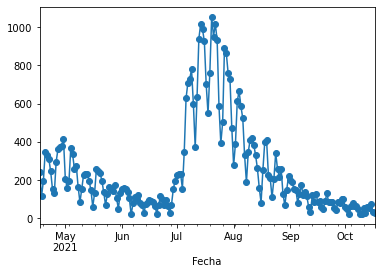

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', 'Tasa de positividad (%)',
                   #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 28
entrenoDesde = '2021-04-17'
entrenoHasta = '2021-10-17'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-04-17,0.000099,-3.922416e-07,-0.008039,0.000149,-0.000268,0.000047,0.007090,0.000108,-0.000147,-0.000022,...,-0.004143,0.000431,0.000045,-7.229922e-06,0.005221,-0.000797,0.000304,-0.000089,-0.013909,-0.000209
2021-04-18,-0.000324,-2.254210e-07,-0.002224,0.000466,0.000254,0.000007,-0.002400,0.000147,-0.000266,0.000042,...,0.016043,-0.001346,0.000263,2.167792e-06,-0.009109,0.000626,-0.000163,-0.000004,0.005142,-0.000138
2021-04-19,-0.000405,5.621373e-05,0.009333,0.000631,0.000013,-0.000033,-0.009739,0.000739,0.000161,0.000017,...,-0.008121,-0.000168,-0.000723,7.831546e-05,0.010766,-0.001194,0.000047,0.000021,-0.002157,0.000685
2021-04-20,0.000014,-2.328634e-05,0.002051,0.000616,-0.000272,0.000050,0.006098,0.000686,-0.000114,-0.000021,...,-0.009060,-0.000052,0.000176,-3.241815e-05,-0.006416,-0.000019,-0.000597,0.000080,0.009251,-0.001114
2021-04-21,-0.000125,-2.593671e-05,0.003058,0.000251,0.000090,-0.000017,0.000101,0.000563,-0.000408,0.000068,...,-0.001034,-0.002775,0.000110,4.175746e-06,-0.012992,0.000141,-0.000278,0.000014,0.008000,-0.000688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-13,-0.000528,4.272425e-05,0.007379,-0.000329,0.000402,-0.000078,-0.003421,0.001504,0.000475,-0.000077,...,0.001071,0.000268,0.000002,-1.052483e-05,0.002238,-0.001005,0.000286,-0.000084,-0.017687,0.000996
2021-10-14,-0.000302,4.471271e-05,0.007680,0.000577,-0.000469,0.000023,0.008533,0.000119,0.000727,-0.000106,...,-0.000537,0.000074,0.000010,5.409973e-07,-0.001562,0.000177,-0.000095,-0.000018,-0.002958,-0.000467
2021-10-15,-0.000094,2.430456e-05,-0.000389,0.000219,-0.000387,0.000046,0.010536,0.000448,-0.000317,0.000011,...,0.005998,-0.000521,0.000467,-8.238534e-05,-0.004492,0.000121,-0.000282,0.000023,0.002861,0.000292


In [94]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Casos,0.549845,0.005657,2.497027,-0.898799,-0.390508,0.017094,8.372285,-0.413133,0.252882,0.008223,...,-0.470724,0.571247,0.151582,-0.037013,-3.595105,1.162343,-0.355815,0.036738,12.366327,0.08736


In [95]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,8.31,48.0,334.0,3634.0,9.19,48.0,370.0,4377.0,...,9.27,50.0,235.0,2216.0,10.6,56.0,239.0,2734.0,8.74,49.0


,Casos est. lineal
Fecha,
2021-05-07,247.812795


In [96]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-04-22    311.0
2021-04-23    245.0
2021-04-24    152.0
2021-04-25    133.0
2021-04-26    297.0
              ...  
2021-10-15     74.0
2021-10-16     34.0
2021-10-17     30.0
2021-10-18     87.0
2021-10-19     93.0
Name: Casos, Length: 181, dtype: float64

In [97]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-04-22,277.167577
2021-04-23,305.646195
2021-04-24,133.025618
2021-04-25,132.729074
2021-04-26,225.484153
...,...
2021-10-15,70.050349
2021-10-16,25.147811
2021-10-17,-4.814381


In [98]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-10-20'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-04-22,311.0,277.167577
2021-04-23,245.0,305.646195
2021-04-24,152.0,133.025618
2021-04-25,133.0,132.729074
2021-04-26,297.0,225.484153
...,...,...
2021-10-16,34.0,25.147811
2021-10-17,30.0,-4.814381
2021-10-18,87.0,102.741755


In [99]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-04-22 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-10-14,54.0,37.580738,89.541173
2021-10-15,74.0,70.050349,86.097021
2021-10-16,34.0,25.147811,67.993050
2021-10-17,30.0,-4.814381,47.509944
2021-10-18,87.0,102.741755,80.191801
2021-10-19,93.0,193.271855,121.284247
2021-10-20,NaN,224.446791,136.838899
2021-10-21,NaN,NaN,156.008361
2021-10-22,NaN,NaN,160.782858
2021-10-23,NaN,NaN,129.770669


(-0.016857670877893995, 30.926426136976172)

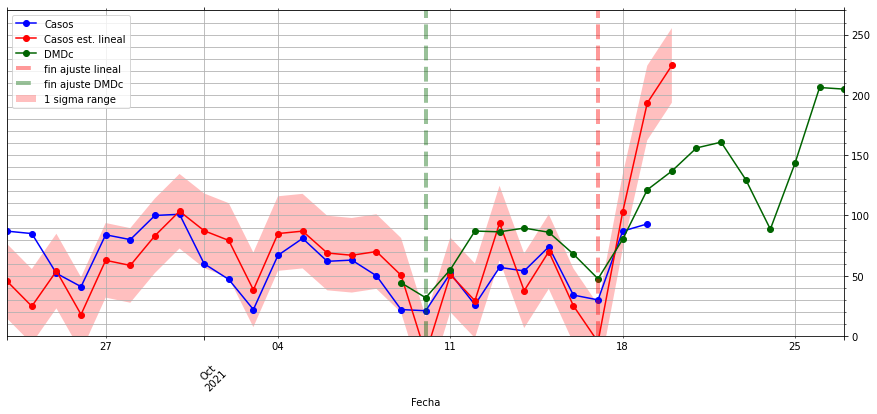

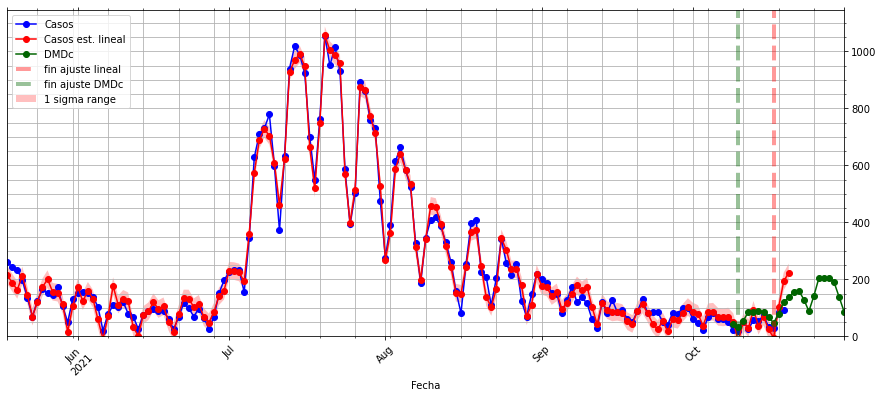

In [100]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

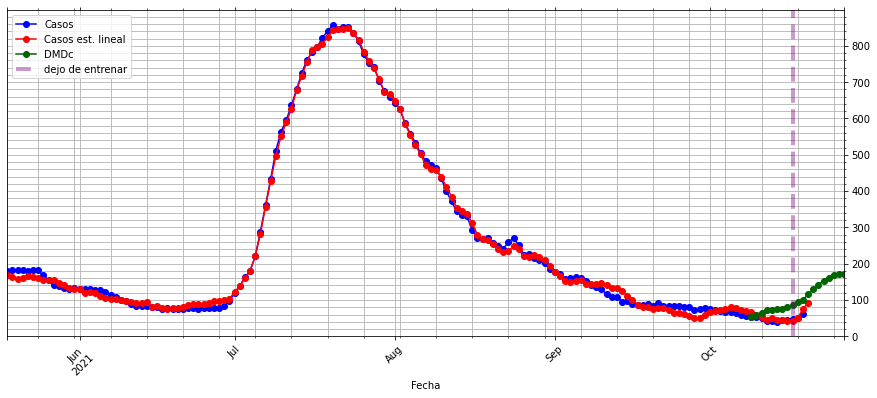

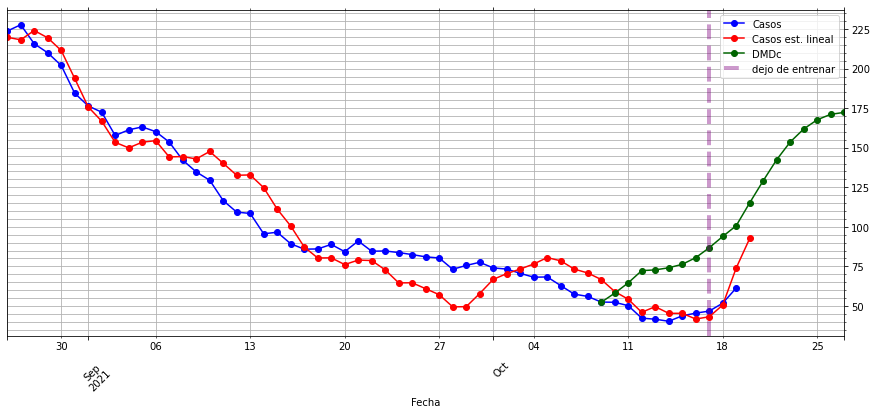

In [101]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [102]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(-0.016857670877893995, 30.926426136976172)

In [103]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

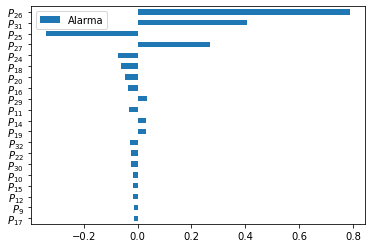

In [104]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

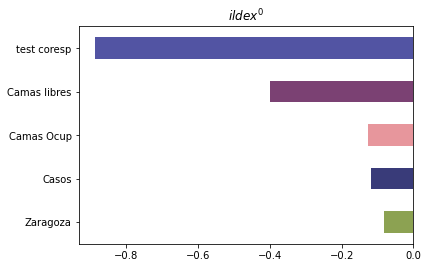

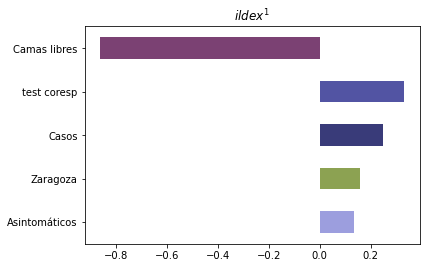

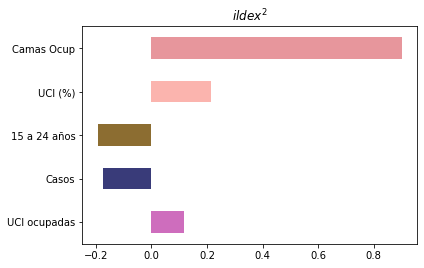

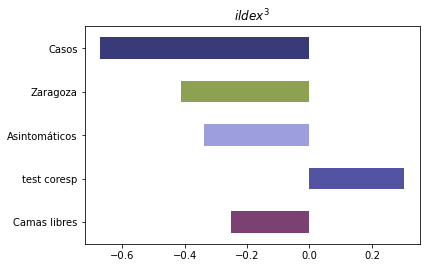

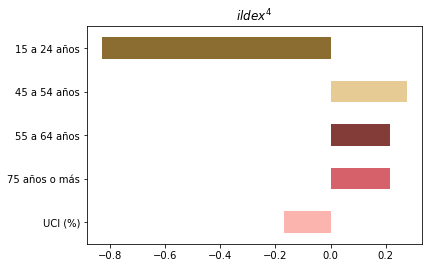

...

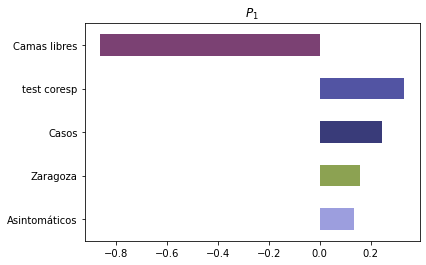

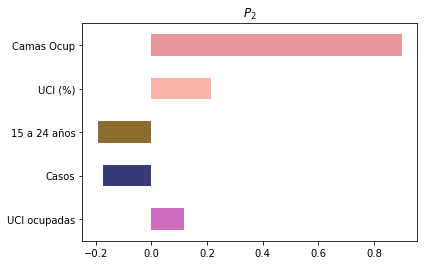

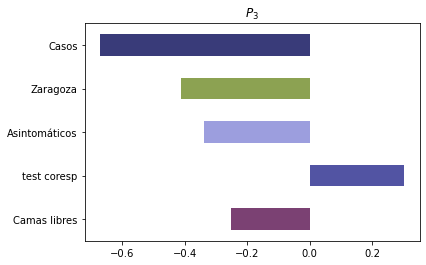

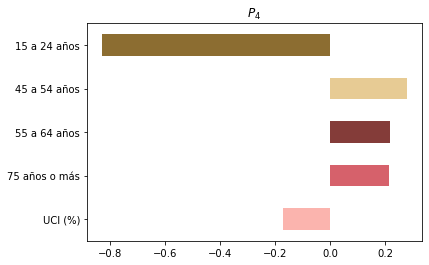

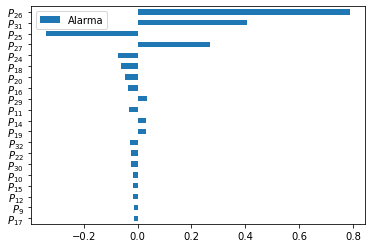

KeyError: 'Total Casos 75 años o más'

In [105]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes